In [23]:
from IPython.core.display import HTML
HTML("<style>div.cell{width:100%;}</style>")

Reconnaissance simpliste de visages par colorimétrie
============================

On considère un observateur unique dans des conditions d'éclairage stables. 
Plusieurs visages seront présentés, numérisés et le logiciel devra, en s'inspirant de l'oeuvre de Peer, distinguer les différentes personnes. 

Principe:
--------
L'algorithme général fonctionne ainsi :
- pour chaque visage présenté:
    - extraction de la peau par appartenance à un espace de couleurs défini empiriquement
    - catégorisation de la peau par histogrammes normalisés
    - stockage de ces histogrammes dans une base de données
    - comparaison par différence avec les histogrammes en base de données
    - affichage des résultats
    
Les photos tests sont issues de https://flic.kr/s/aHsjrq8gBB

Références:
-----------

**Peer et al. 1984** : Un pixel RGB d'une photo peut correspondre à la couleur de la peau si

    (R > 95 and G > 40 and B < 20 and (max{R, G, B} – min{ R, G, B })> 15 and |R - G| > 15 and R > G and R > B)
    ou 
    (R > 220 and G > 210 and B > 170 and |R - G| = 15 and R > B and G > B)

R, G et B sont bien entendu les composantes rouge, verte et bleue codées chacune sur 8bits et prenant ainsi une valeur comprise entre 0 et 255.

Initialisation
-------------
On utilise les modules 
- **numpy** car une image n'est rien de plus qu'une matrice de composantes RGB
- **matplotlib**
- **skimage** pour lire les photos et redimmensionner les photos trop grandes
- **bokeh** pour afficher les histogrammes de manière interactive


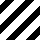
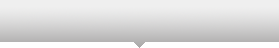
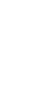
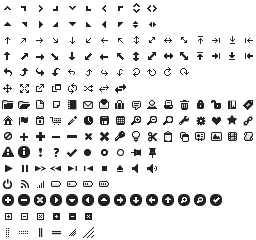
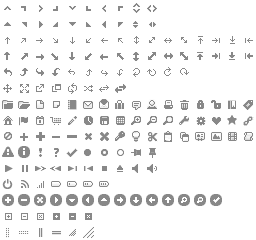
...
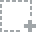
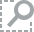
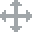
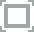
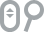

In [24]:
import numpy as np
from IPython.display import display

from bokeh.plotting import *
#from bokeh.plotting import figure, output_file, show
from bokeh.charts import Step, show
output_notebook()

import matplotlib.pyplot as plt
%matplotlib inline

from skimage import io
from skimage.transform import resize
from skimage import img_as_ubyte

from collections import OrderedDict

Implémentation des fonctions
----------------------------
Pour chaque fonction, un argument booléen optionnel nommé **affiche** permet d'afficher des messages et l'image retournée par la fonction. Par défaut, **affiche** est *False*.

La fonction **ouvrePhoto** lit la photo **chemin** et retourne une image. *chemin* peut être un fichier sur le disque ou un URL.

In [2]:
def ouvrePhoto(chemin, affiche=False):
    image = io.imread(chemin)
    if (affiche):
        print("Import de la photo", chemin,"de dimension",image.shape)
        plt.imshow(image)
        plt.show()
    return image

La fonction **redimensionneImage** retourne une copie redimensionnée de l'image **imageOriginale** de **hauteurFinale** -par défaut 300- pixels de hauteur.

In [3]:
def redimensionneImage(imageOriginale, hauteurFinale = 300, affiche=False):
    hauteurInitiale, largeurInitiale, profondeurInitiale = imageOriginale.shape
    image = img_as_ubyte(resize(imageOriginale, (hauteurFinale, int(hauteurFinale * largeurInitiale / hauteurInitiale))))
    
    if (affiche):
        plt.imshow(image)
        plt.show()
    
    return image

La fonction **peau** retourne une une copie de **image** dont tous les pixels non caractérisés comme de la peau ont été noircis.
On utilise les composantes réduites:
- r = R/(R+G+B)
- g = G/(R+G+B)
- b = B/(R+G+B)

Les arguments **rmin**,**rmax**,**gmin**,**gmax**,**bmin**,**bmax** sont les valeurs minimales et maximales de chaque composante.

In [4]:
#def peau(image,affiche=False,rmin=0.37,rmax=0.55,gmin=0.29,gmax=0.34,bmin=0.17,bmax=0.30):
def peau(image,affiche=False,rmin=0.31,rmax=0.49,gmin=0.24,gmax=0.33,bmin=0.25,bmax=0.36):
    peau = np.zeros(image.shape, dtype=np.uint8)
    for i in range(len(image)):
        for j in range(len(image[0])):
            denom = float(image[i,j,0])+float(image[i,j,1])+float(image[i,j,2])
            if (denom>0.0):
                if (rmin < (image[i,j,0]/denom) < rmax):
                    if (gmin < (image[i,j,1]/denom) < gmax):
                        if (bmin < (image[i,j,2]/denom) < bmax):
                            peau[i,j,0]=image[i,j,0]
                            peau[i,j,1]=image[i,j,1]
                            peau[i,j,2]=image[i,j,2]
    
    if (affiche):
        print("Extraction de la peau")
        plt.imshow(peau)
        plt.show()
        
    return peau

Pour référence, **PeerEtAl84** est une fonction alternative à **peau** tel qu'initialement implémenté par Peer et al. 1984. 

In [5]:
def PeerEtAl84(image, affiche=False):
    peau = np.zeros(image.shape, dtype=np.uint8)
    for i in range(len(image)):
        for j in range(len(image[0])):
            R = image[i,j,0]
            G = image[i,j,1]
            B = image[i,j,2]
            if ((R > 95) and (G > 40) and (B > 20) and (( max(R,G,B) - min(R,G,B) ) > 15 ) and (R > G) and (R > B) and (abs(R - G) > 15)):
                peau[i,j,0]=image[i,j,0]
                peau[i,j,1]=image[i,j,1]
                peau[i,j,2]=image[i,j,2]            
            if ((R > 220) and (G > 210) and (B > 170) and (abs(R-G)==15) and (R > B) and (G > B)):
                peau[i,j,0]=image[i,j,0]
                peau[i,j,1]=image[i,j,1]
                peau[i,j,2]=image[i,j,2]
    if (affiche):
        print("Extraction de la peau")
        plt.imshow(peau)
        plt.show()
        
    return peau

Zonage
-----
Une fois la découverte de la peau réalisée, on sépare les zones de peau distinctes en implémentant un algorithme de "tache d'huile" via la fonction "inonde". On sélectionne ensuite la "tache" la plus grande en supposant qu'elle contient l'essentiel du visage.

Deux versions sont présentées : 
- inondeRécursif : implémentation récursive classique en programmation fonctionnelle. Python "explose" si l'image traitée est trop grande. Pourquoi? C'est un choix de Guido Van Rossum, créateur du language Python qui ne souhaite pas que son langage optimise l'interprétation de fonctions récursives.
- inonde : implémentation non récursive adaptée au langage Python. C'est celle que nous utiliserons. Elle utilise une *pile* interne pour stocker les coordonnées des pixels voisins à visiter.

Ce zonage constitue le principal intérêt de ce projet car, par défaut, un développeur débutant implémente systématiquement **inondeRécursif** qui fonctionne a merveille avec d'autres languages, mais pas avec Python. Il faut donc réfléchir différement afin d'adapter son propre code aux contraintes du language Python.


> Python n'est pas un langage de programmation "fonctionnelle". C'est -en outre- un langage qui se débrouille très mal avec les fonctions récursives.

**inondeRecursif** et **inonde** sont deux fonctions au résultat identique.
Elles prennent en argument :
- zones : matrice de même dimension que la photo originale ou chaque élément a une valeur entière positive correspondant au numéro de zone du pixel.
- skin : matrice de peau de la photo originale
- i,j : coordonnées dans la matrice, point actif
- z : identifiant courrant de la zone de peau, incrémenté à chaque découverte d'une nouvelle zone.
   - z = 0 si pas traité
   - z = 1 si pas de peau
   - z = 2 si la zone ne comprend qu'un seul pixel de peau
   - z >= 3 pour chacune des zones de peau 
- n : nombre de pixels découverts dans la zone de peau

L'utilisation de **inondeRecursif** implique de modifier le paramètre "recusionlimit" de Python. C'est inutile pour **inonde**.

**inondeRecursif** et **inonde** retournent **n** et modifient **zones** et **n**.

Bien entendu, on utilisera **inonde** et non pas **inondeRecursif**.

In [6]:
import sys
sys.setrecursionlimit(10000)
def inondeRecursif(zones,skin,i,j,z,n):
    c = 0
    if ( 0 < i < len(skin)-1 ) and ( 0 < j < len(skin[0])-1 ) and (skin[i,j].any()) and (zones[i,j]==0):
        zones[i,j] = z
        n += 1
        n = inonde(zones,skin,i-1,j,z,n)
        n = inonde(zones,skin,i+1,j,z,n)
        n = inonde(zones,skin,i,j-1,z,n)
        n = inonde(zones,skin,i,j+1,z,n)
    return n

In [7]:
def inonde(zones,skin,i,j,z,n):
    pile = [ (i, j) ]
    while (len(pile) > 0):
        i, j = pile.pop()
        if not(( 0 < i < len(skin)-1 ) and ( 0 < j < len(skin[0])-1 ) and (skin[i,j].any()) and (zones[i,j]==0)):
        #if skin[i][j] != oldColor:
            continue
        zones[i][j] = z
        n += 1
        pile.append( (i + 1, j) )  # right
        pile.append( (i - 1, j) )  # left
        pile.append( (i, j + 1) )  # down
        pile.append( (i, j - 1) )  # up
    return n

La fonction **zone** partitionne la matrice de peau **skin**. Elle retourne :
- une matrice **zones**
- le n° de zone **idDeZoneDePeau** supposé correspondre à la zone de peau principale
- z, le nombre de zones distinctes
- comptage, une tableau indiquant le nombre de pixels par zone.

In [8]:
def zone(skin, affiche=False):
    zones = np.zeros((len(skin),len(skin[0])), dtype=np.integer)
    comptage = [ zones.size, 0, 0, 0] 
    # z = 0 si pas traité
    # z = 1 si pas de peau
    # z = 2 si la zone ne comprend qu'un seul pixel de peau
    # z >= 3 pour chacune des zones de peau
    z = 3
    for i in range(1,len(skin)-1):
        for j in range(1,len(skin[0])-1):
            if zones[i,j]==0:
                if skin[i,j].any():
                    if skin[i-1,j].any() or skin[i+1,j].any() or skin[i,j+1].any() or skin[i,j-1].any():
                        comptage[z] = inonde(zones,skin,i,j,z,0)
                        z += 1
                        comptage.append(0)
                    else :
                        zones[i,j]=2    
                        comptage[2] += 1
                else:
                    zones[i,j]=1
                    comptage[1] += 1
            comptage[0] -= 1
    idDeZoneDePeau = 2 + np.argmax(comptage[2:])
    
    if (affiche):
        nbDePixelsDePeau = comptage[idDeZoneDePeau]
        print("Comptage des zones de peau: la zone ",idDeZoneDePeau,"contenant",nbDePixelsDePeau,"pixels est la plus large.")
        plt.imshow(zones)
        plt.show()
    
    return zones, idDeZoneDePeau, z, comptage

De la photo originale **photo**, on extrait la zone de peau identifiée par **idDeZoneDePeau** et la matrice de peau **skin**  avec la fonction **selectionneUneZone**

In [9]:
def selectionneUneZone(photo,skin,idDeZoneDePeau, affiche=False):
    visagePale = np.copy(photo)
    for i in range(len(skin)):
        for j in range(len(skin[0])):
            if (skin[i,j] != idDeZoneDePeau ):
                visagePale[i,j]=[0,0,0]
    if (affiche):
        print("Voici la zone de peau sélectionnée correspondant à l'ID n°",idDeZoneDePeau)
        plt.imshow(visagePale)
        plt.show()
    return visagePale

La fonction **histogrammeRGBn** retourne un comptage des composantes réduites r,g,b d'une image sans compter le noir sous la forme de 3 histogrammes normalisés. Si l'option affiche est activée, alors un graphique est présenté

In [10]:
def histogrammeRGBn(image, affiche=False):
    # Retourne un comptage des composantes R,G,B d'une image sans compter le noir
    # sous la forme de 3 histogrammes normalisés
    # si l'option affiche est activée, alors un graphique est présenté
    histoR = np.zeros(256, dtype='double')
    histoG = np.zeros(256, dtype='double')
    histoB = np.zeros(256, dtype='double')
    # comptage des pixels/composante non nuls et création des histogrammes non normalisés
    nbPixelsNonNoirs = 0
    for ligne in image:
        for pixel in ligne:
            if ( np.sum(pixel) != 0 ):
                nbPixelsNonNoirs += 1
                s = np.sum(pixel)
                histoR[int(255*pixel[0]/s)] += 1
                histoG[int(255*pixel[1]/s)] += 1
                histoB[int(255*pixel[2]/s)] += 1
    # on normalise les histogrammes
    histoR /= nbPixelsNonNoirs
    histoG /= nbPixelsNonNoirs
    histoB /= nbPixelsNonNoirs
    
    # on affiche les histogrammes par défaut
    if (affiche == True):
        show(Step([histoR, histoG, histoB], title="Histogramme des couleurs rgb", xlabel="valeur de la composante r,g ou b",ylabel='Proportion'))
        
    # on retourne les 3 histogrammes normalisés
    return histoR,histoG,histoB

La fonction **medianeDesCouleurs** retourne les 3 médianes des composantes RGB de l'**image** hors comptage du noir.

In [11]:
def medianeDesCouleurs(image, affiche=False):
    # comptage des pixels/composante non nuls
    tabR = []
    tabG = []
    tabB = []
    for ligne in image:
        for pixel in ligne:
            if ( np.sum(pixel) != 0 ):
                tabR.append(pixel[0])
                tabG.append(pixel[1])
                tabB.append(pixel[2])
    medianR = sorted(tabR)[int(len(tabR)/2)]
    medianG = sorted(tabG)[int(len(tabG)/2)]
    medianB = sorted(tabB)[int(len(tabB)/2)]
    return medianR, medianG, medianB

La fonction **differenceEntreHistogrammes** retourne un score en comparant deux histogrammes de couleurs. Plus le score est faible, plus les histogrammes se ressemblent.

In [12]:
def differenceEntreHistogrammes(histo1,histo2):
    scoreA = 0
    scoreB = 0
    scoreC = 0
    for i in range(256):
        scoreA +=  abs(histo1[0][i]-histo2[0][i])
        scoreB +=  abs(histo1[1][i]-histo2[1][i])
        scoreC +=  abs(histo1[2][i]-histo2[2][i])
    return (scoreA + scoreB + scoreC)
    

La fonction **analysePhoto** charge une photo **chemin**, cherche la peau et stocke l'histogramme de peau associé au nom du fichier dans un dictionnaire **db** 

In [13]:
def analysePhoto(chemin, db, affiche=False, redimmensionne=False, peeretal=False):
    if affiche:
        print("Analyse de la photo",chemin)
    try:
        visage = ouvrePhoto(chemin, affiche)
        if redimmensionne:
            miniVisage = redimensionneImage(visage, 600, affiche)
        else:
            miniVisage = visage       
        if peeretal:
            skin = PeerEtAl84(miniVisage, affiche)
        else:
            skin = peau(miniVisage,affiche)   
        carte, idDeZoneDePeau, z, comptage = zone(skin,affiche)  
        visagePale = selectionneUneZone(miniVisage,carte,idDeZoneDePeau, affiche)      
        histoRGBn = histogrammeRGBn(visagePale,affiche)
    except Exception as e:
        print("Erreur : ",e)
    else:
        db[chemin] = histoRGBn
    return None

La fonction **comparePhoto** affiche les scores de comparaison de la **photo** à tous les autres éléments de la base de données **db**  

In [14]:
def comparePhoto(photo, db):
    for chemin, histo in db.items():
        dif = differenceEntreHistogrammes(db[photo],histo)
        print(chemin,", dif = ", dif)
    return None

        

La fonction **comparePhotos** compare entre elles chacune des entrées dans la base de données **db** et pour chaque photo, on affiche la photo la plus semblable.

In [15]:
from IPython.display import Image
def comparePhotos(db):
    for chemin1, histo1 in db.items():
        ppdif = 666.0 # valeure arbitrairement grande
        ppchemin = chemin1
        for chemin2, histo2 in db.items():
            dif = differenceEntreHistogrammes(histo1,histo2)
            if (dif < ppdif) and (dif > 0.0) :
                ppdif = dif
                ppchemin = chemin2
    
        print(chemin1,"vs",ppchemin,", dif = ", ppdif)
        display(Image(filename=chemin1),Image(filename=ppchemin))
    return None

Programme principal
===================
Ce programme cherche les fichiers jpg dans le répertoire "Photos", analyse chaque photo et stocke les noms de fichiers et histogrammes normalisés dans un dictionnaire **histo**. 

32 photos sont disponibles dans le répertoire
Analyse de la photo Photos/bet1.jpg
Import de la photo Photos/bet1.jpg de dimension (640, 427, 3)


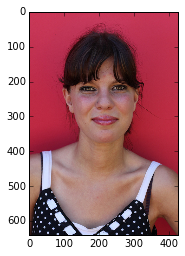

Extraction de la peau


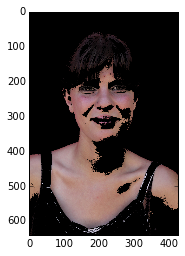

Comptage des zones de peau: la zone  56 contenant 66133 pixels est la plus large.


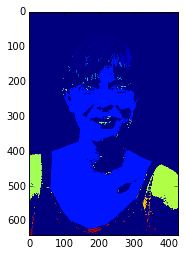

Voici la zone de peau sélectionnée correspondant à l'ID n° 56


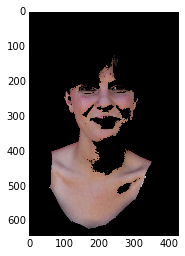

Analyse de la photo Photos/bet2.jpg
Import de la photo Photos/bet2.jpg de dimension (640, 427, 3)


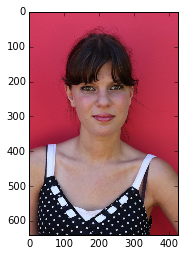

Extraction de la peau


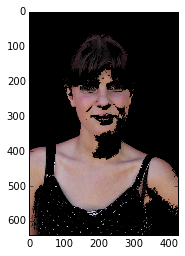

Comptage des zones de peau: la zone  64 contenant 54605 pixels est la plus large.


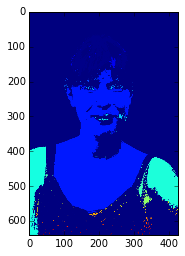

Voici la zone de peau sélectionnée correspondant à l'ID n° 64


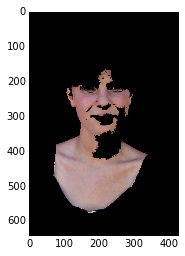

Analyse de la photo Photos/bet3.jpg
Import de la photo Photos/bet3.jpg de dimension (640, 427, 3)


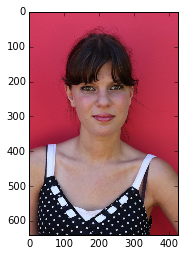

Extraction de la peau


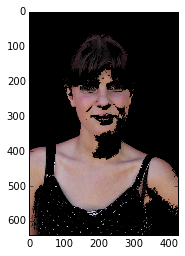

Comptage des zones de peau: la zone  64 contenant 54605 pixels est la plus large.


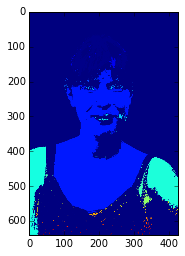

Voici la zone de peau sélectionnée correspondant à l'ID n° 64


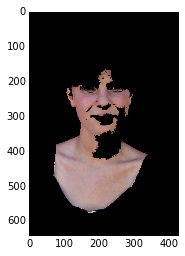

Analyse de la photo Photos/bill1.jpg
Import de la photo Photos/bill1.jpg de dimension (640, 427, 3)


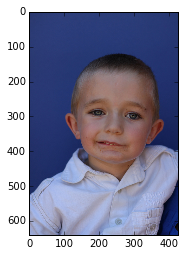

Extraction de la peau


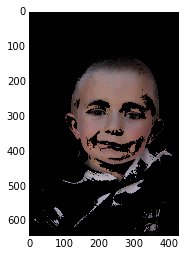

Comptage des zones de peau: la zone  17 contenant 56491 pixels est la plus large.


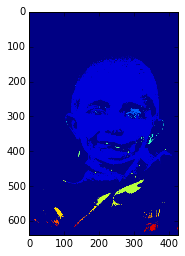

Voici la zone de peau sélectionnée correspondant à l'ID n° 17


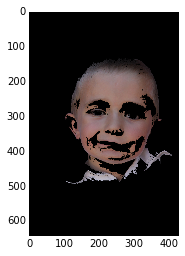

Analyse de la photo Photos/bill2.jpg
Import de la photo Photos/bill2.jpg de dimension (640, 427, 3)


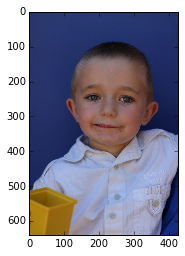

Extraction de la peau


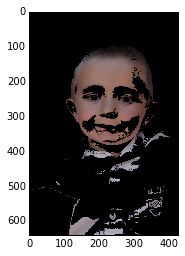

Comptage des zones de peau: la zone  8 contenant 43557 pixels est la plus large.


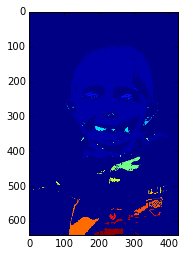

Voici la zone de peau sélectionnée correspondant à l'ID n° 8


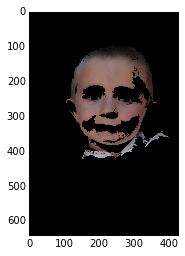

Analyse de la photo Photos/bill3.jpg
Import de la photo Photos/bill3.jpg de dimension (640, 427, 3)


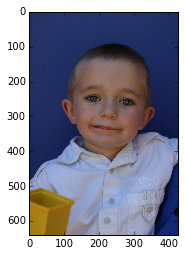

Extraction de la peau


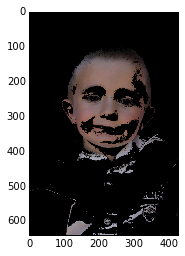

Comptage des zones de peau: la zone  18 contenant 44481 pixels est la plus large.


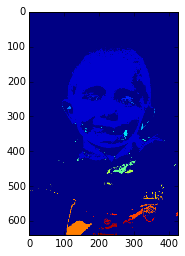

Voici la zone de peau sélectionnée correspondant à l'ID n° 18


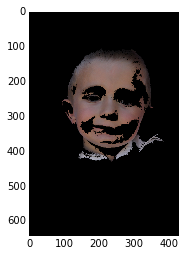

Analyse de la photo Photos/dad1.jpg
Import de la photo Photos/dad1.jpg de dimension (640, 427, 3)


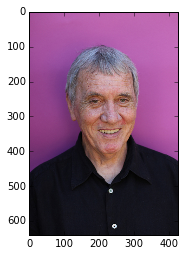

Extraction de la peau


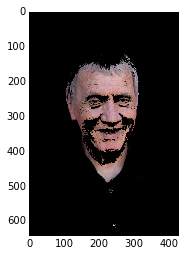

Comptage des zones de peau: la zone  10 contenant 28383 pixels est la plus large.


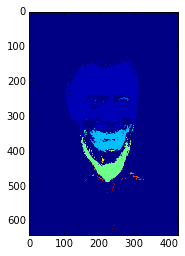

Voici la zone de peau sélectionnée correspondant à l'ID n° 10


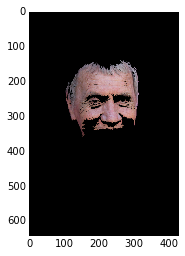

Analyse de la photo Photos/dad2.jpg
Import de la photo Photos/dad2.jpg de dimension (640, 427, 3)


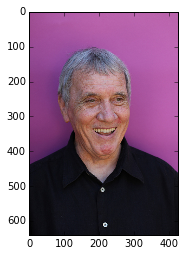

Extraction de la peau


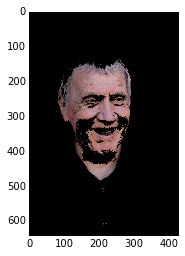

Comptage des zones de peau: la zone  8 contenant 27534 pixels est la plus large.


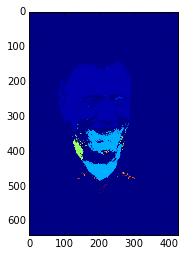

Voici la zone de peau sélectionnée correspondant à l'ID n° 8


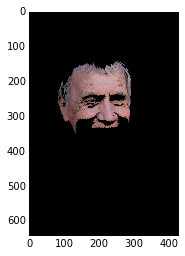

Analyse de la photo Photos/dad3.jpg
Import de la photo Photos/dad3.jpg de dimension (640, 427, 3)


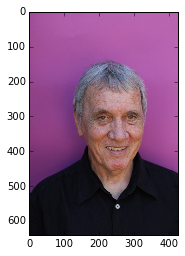

Extraction de la peau


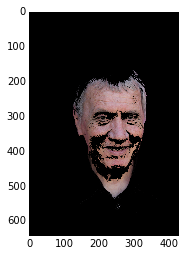

Comptage des zones de peau: la zone  12 contenant 28889 pixels est la plus large.


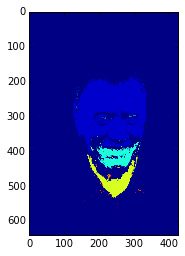

Voici la zone de peau sélectionnée correspondant à l'ID n° 12


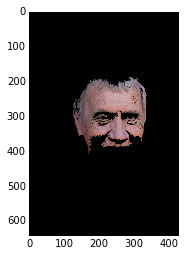

Analyse de la photo Photos/flo1.jpg
Import de la photo Photos/flo1.jpg de dimension (640, 427, 3)


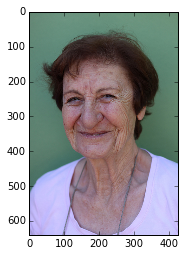

Extraction de la peau


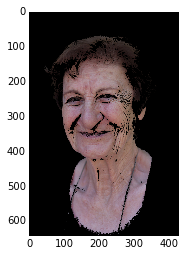

Comptage des zones de peau: la zone  4 contenant 99960 pixels est la plus large.


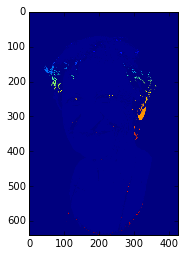

Voici la zone de peau sélectionnée correspondant à l'ID n° 4


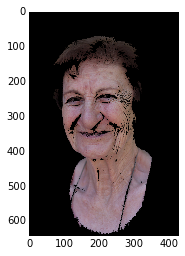

Analyse de la photo Photos/flo2.jpg
Import de la photo Photos/flo2.jpg de dimension (640, 427, 3)


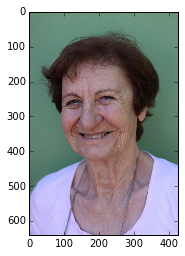

Extraction de la peau


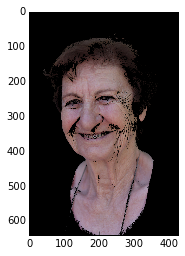

Comptage des zones de peau: la zone  4 contenant 103118 pixels est la plus large.


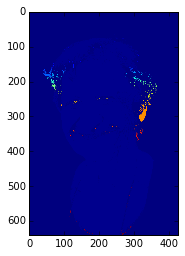

Voici la zone de peau sélectionnée correspondant à l'ID n° 4


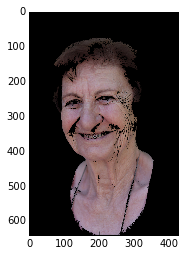

Analyse de la photo Photos/flo3.jpg
Import de la photo Photos/flo3.jpg de dimension (640, 427, 3)


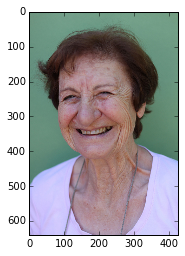

Extraction de la peau


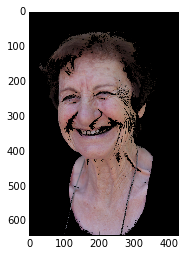

Comptage des zones de peau: la zone  3 contenant 107995 pixels est la plus large.


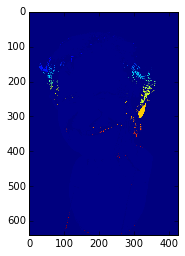

Voici la zone de peau sélectionnée correspondant à l'ID n° 3


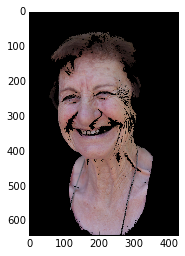

Analyse de la photo Photos/fly1.jpg
Import de la photo Photos/fly1.jpg de dimension (640, 427, 3)


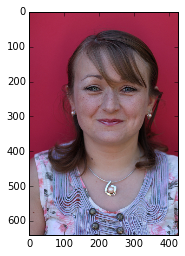

Extraction de la peau


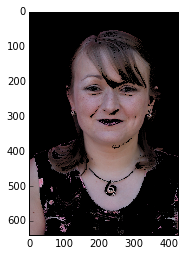

Comptage des zones de peau: la zone  3 contenant 92001 pixels est la plus large.


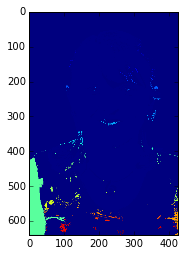

Voici la zone de peau sélectionnée correspondant à l'ID n° 3


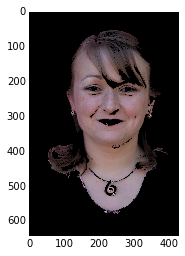

Analyse de la photo Photos/fly2.jpg
Import de la photo Photos/fly2.jpg de dimension (640, 427, 3)


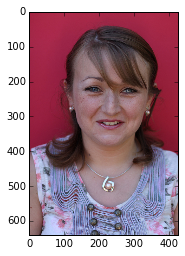

Extraction de la peau


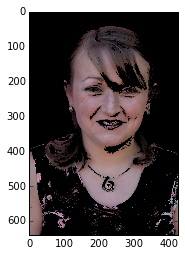

Comptage des zones de peau: la zone  3 contenant 85789 pixels est la plus large.


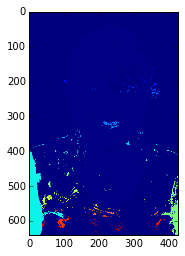

Voici la zone de peau sélectionnée correspondant à l'ID n° 3


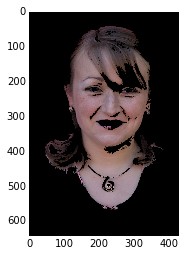

Analyse de la photo Photos/fly3.jpg
Import de la photo Photos/fly3.jpg de dimension (640, 427, 3)


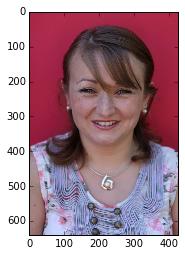

Extraction de la peau


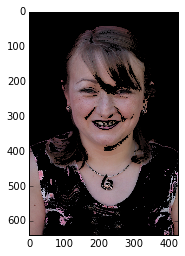

Comptage des zones de peau: la zone  3 contenant 82144 pixels est la plus large.


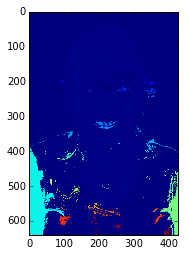

Voici la zone de peau sélectionnée correspondant à l'ID n° 3


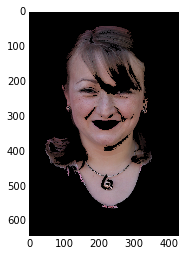

Analyse de la photo Photos/fred1.jpg
Import de la photo Photos/fred1.jpg de dimension (640, 427, 3)


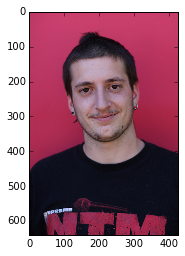

Extraction de la peau


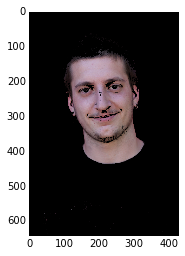

Comptage des zones de peau: la zone  51 contenant 50523 pixels est la plus large.


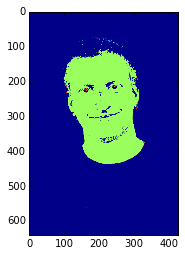

Voici la zone de peau sélectionnée correspondant à l'ID n° 51


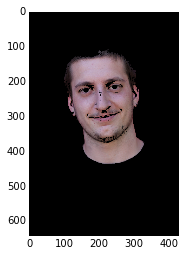

Analyse de la photo Photos/fred2.jpg
Import de la photo Photos/fred2.jpg de dimension (640, 427, 3)


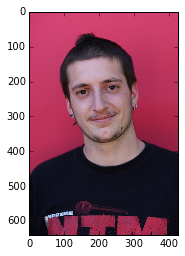

Extraction de la peau


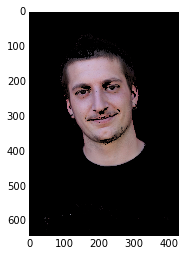

Comptage des zones de peau: la zone  66 contenant 51691 pixels est la plus large.


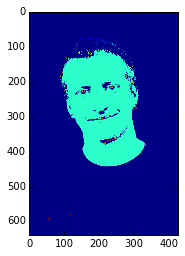

Voici la zone de peau sélectionnée correspondant à l'ID n° 66


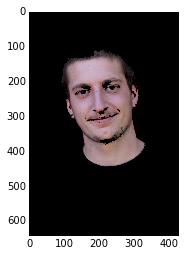

Analyse de la photo Photos/fred3.jpg
Import de la photo Photos/fred3.jpg de dimension (640, 427, 3)


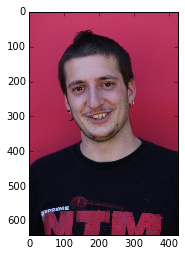

Extraction de la peau


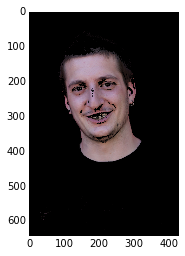

Comptage des zones de peau: la zone  50 contenant 49717 pixels est la plus large.


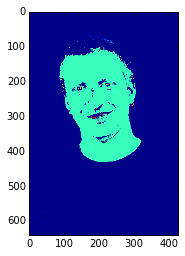

Voici la zone de peau sélectionnée correspondant à l'ID n° 50


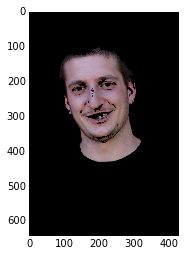

Analyse de la photo Photos/jack1.jpg
Import de la photo Photos/jack1.jpg de dimension (640, 427, 3)


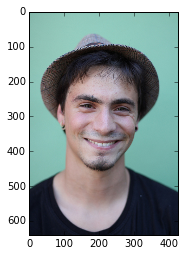

Extraction de la peau


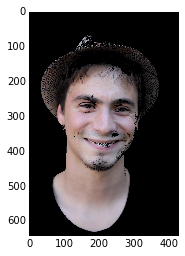

Comptage des zones de peau: la zone  107 contenant 93755 pixels est la plus large.


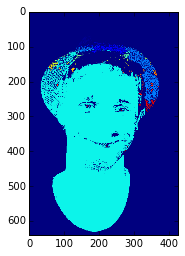

Voici la zone de peau sélectionnée correspondant à l'ID n° 107


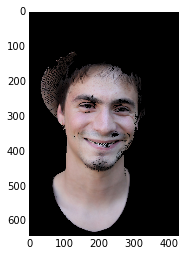

Analyse de la photo Photos/jack2.jpg
Import de la photo Photos/jack2.jpg de dimension (640, 427, 3)


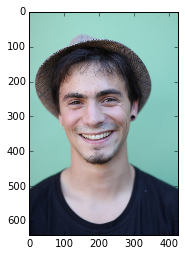

Extraction de la peau


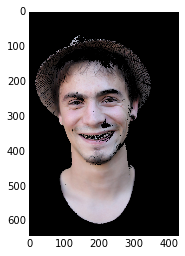

Comptage des zones de peau: la zone  29 contenant 91104 pixels est la plus large.


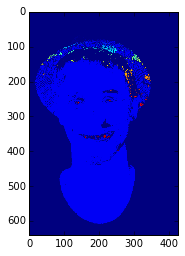

Voici la zone de peau sélectionnée correspondant à l'ID n° 29


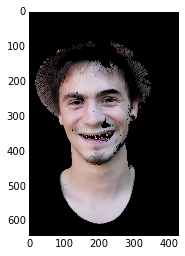

Analyse de la photo Photos/jack3.jpg
Import de la photo Photos/jack3.jpg de dimension (640, 427, 3)


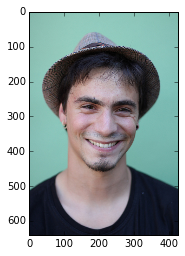

Extraction de la peau


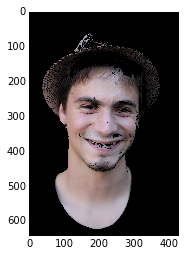

Comptage des zones de peau: la zone  105 contenant 89950 pixels est la plus large.


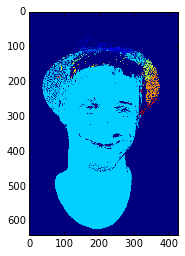

Voici la zone de peau sélectionnée correspondant à l'ID n° 105


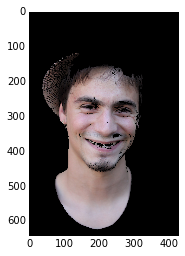

Analyse de la photo Photos/joe1.jpg
Import de la photo Photos/joe1.jpg de dimension (640, 427, 3)


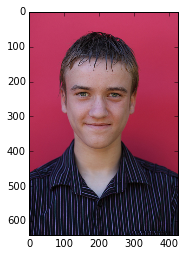

Extraction de la peau


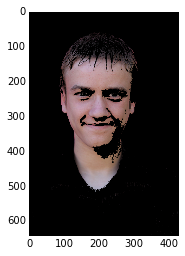

Comptage des zones de peau: la zone  90 contenant 51706 pixels est la plus large.


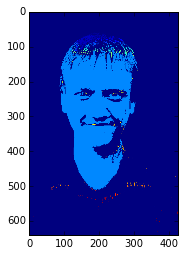

Voici la zone de peau sélectionnée correspondant à l'ID n° 90


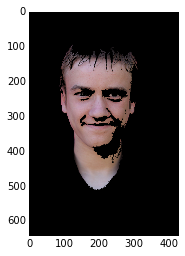

Analyse de la photo Photos/joe2.jpg
Import de la photo Photos/joe2.jpg de dimension (640, 427, 3)


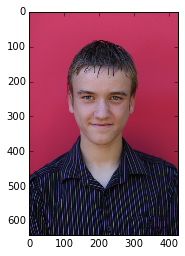

Extraction de la peau


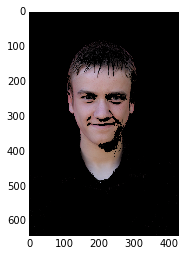

Comptage des zones de peau: la zone  118 contenant 41178 pixels est la plus large.


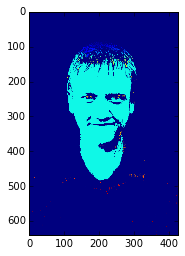

Voici la zone de peau sélectionnée correspondant à l'ID n° 118


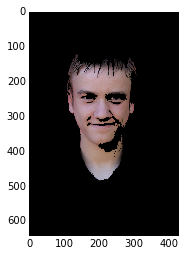

Analyse de la photo Photos/liz1.jpg
Import de la photo Photos/liz1.jpg de dimension (640, 427, 3)


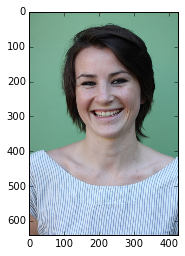

Extraction de la peau


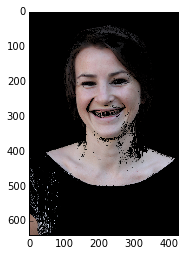

Comptage des zones de peau: la zone  6 contenant 74340 pixels est la plus large.


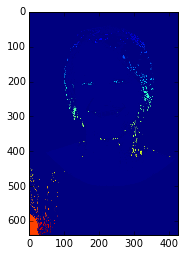

Voici la zone de peau sélectionnée correspondant à l'ID n° 6


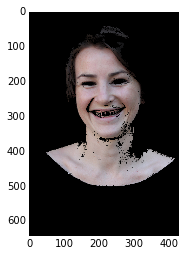

Analyse de la photo Photos/liz2.jpg
Import de la photo Photos/liz2.jpg de dimension (640, 427, 3)


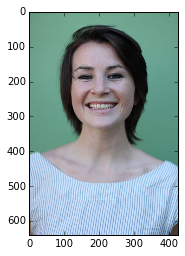

Extraction de la peau


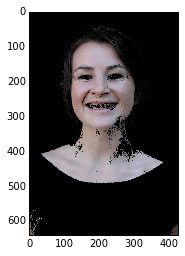

Comptage des zones de peau: la zone  50 contenant 70399 pixels est la plus large.


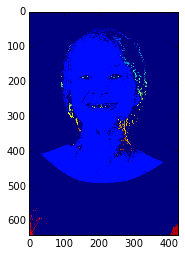

Voici la zone de peau sélectionnée correspondant à l'ID n° 50


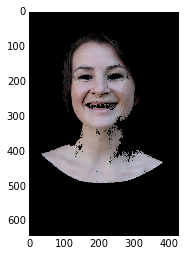

Analyse de la photo Photos/liz3.jpg
Import de la photo Photos/liz3.jpg de dimension (640, 427, 3)


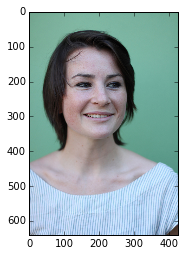

Extraction de la peau


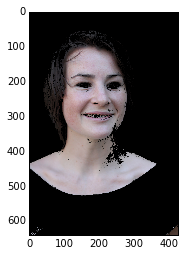

Comptage des zones de peau: la zone  21 contenant 84660 pixels est la plus large.


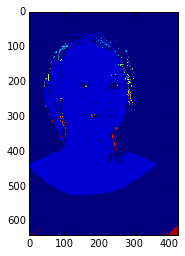

Voici la zone de peau sélectionnée correspondant à l'ID n° 21


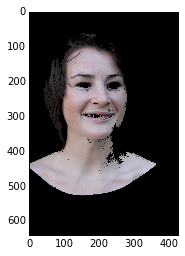

Analyse de la photo Photos/mum1.jpg
Import de la photo Photos/mum1.jpg de dimension (640, 427, 3)


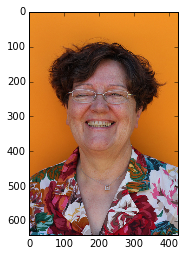

Extraction de la peau


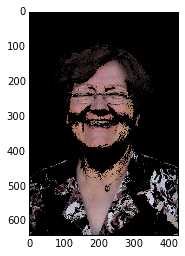

Comptage des zones de peau: la zone  354 contenant 23353 pixels est la plus large.


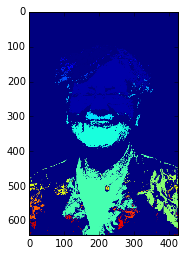

Voici la zone de peau sélectionnée correspondant à l'ID n° 354


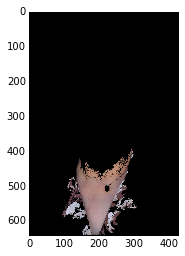

Analyse de la photo Photos/mum2.jpg
Import de la photo Photos/mum2.jpg de dimension (640, 427, 3)


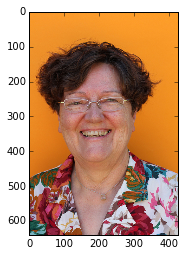

Extraction de la peau


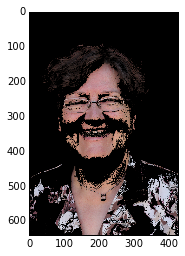

Comptage des zones de peau: la zone  456 contenant 22140 pixels est la plus large.


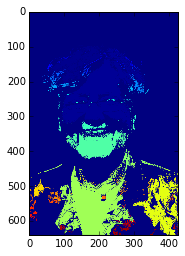

Voici la zone de peau sélectionnée correspondant à l'ID n° 456


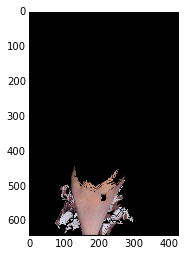

Analyse de la photo Photos/mum3.jpg
Import de la photo Photos/mum3.jpg de dimension (640, 427, 3)


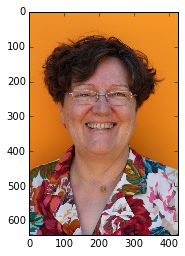

Extraction de la peau


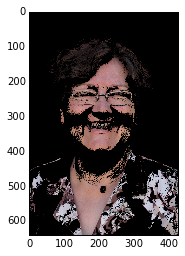

Comptage des zones de peau: la zone  419 contenant 24164 pixels est la plus large.


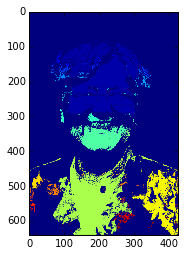

Voici la zone de peau sélectionnée correspondant à l'ID n° 419


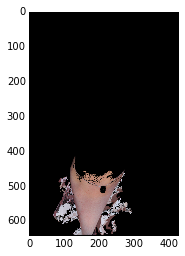

Analyse de la photo Photos/zaz1.jpg
Import de la photo Photos/zaz1.jpg de dimension (640, 427, 3)


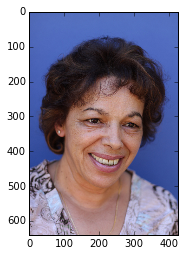

Extraction de la peau


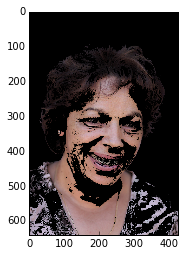

Comptage des zones de peau: la zone  4 contenant 87787 pixels est la plus large.


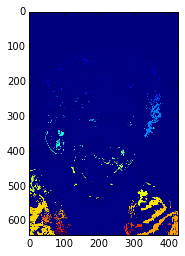

Voici la zone de peau sélectionnée correspondant à l'ID n° 4


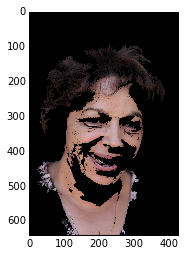

Analyse de la photo Photos/zaz2.jpg
Import de la photo Photos/zaz2.jpg de dimension (640, 427, 3)


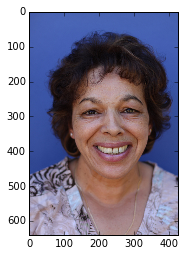

Extraction de la peau


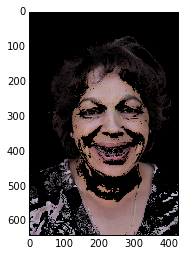

Comptage des zones de peau: la zone  3 contenant 78801 pixels est la plus large.


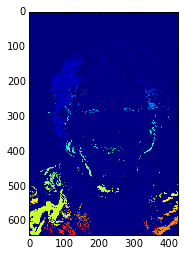

Voici la zone de peau sélectionnée correspondant à l'ID n° 3


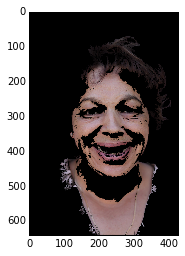

Analyse de la photo Photos/zaz3.jpg
Import de la photo Photos/zaz3.jpg de dimension (640, 427, 3)


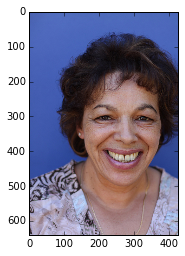

Extraction de la peau


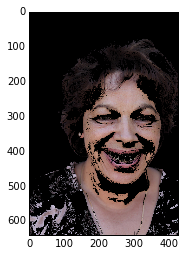

Comptage des zones de peau: la zone  4 contenant 92057 pixels est la plus large.


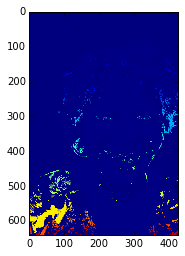

Voici la zone de peau sélectionnée correspondant à l'ID n° 4


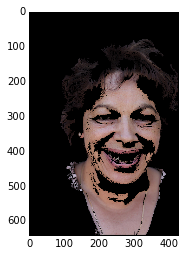

In [16]:
import glob
import platform
if (platform.system() == 'Windows'):
    from pathlib import PureWindowsPath
    repertoire = 'Photos\\'
    chemins = glob.glob(repertoire+"*.jpg")    
    tmpPhotos = [ PureWindowsPath(chemin).name for chemin in chemins ]
else:
    from pathlib import PurePosixPath
    repertoire = 'Photos/'
    chemins = glob.glob(repertoire+"*.jpg")    
    tmpPhotos = [ PurePosixPath(chemin).name for chemin in chemins ]

histo = {}

print( str(len(tmpPhotos)) + " photos sont disponibles dans le répertoire" )

for photo in chemins:   
    try:
        analysePhoto(photo, histo, affiche=True) # mettre affiche=False pour cacher les images et les commentaires
    except:
        print("Impossible d'analyser la photo " + photo)

On compare entre elles chacune des entrées dans le dictionnaire **histo** et pour chaque photo, on affiche la photo la plus semblable.

Photos/jack2.jpg vs Photos/jack1.jpg , dif =  0.634875654542


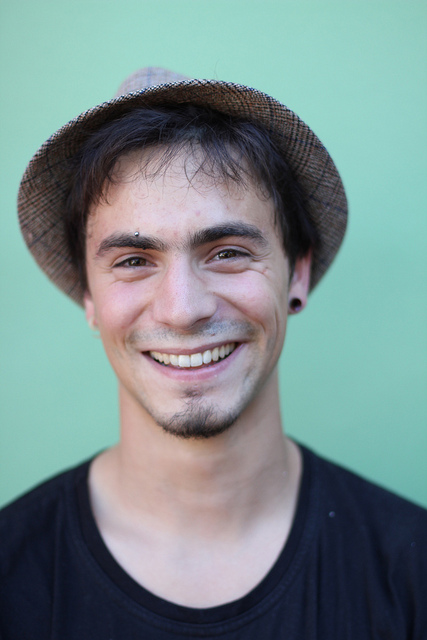

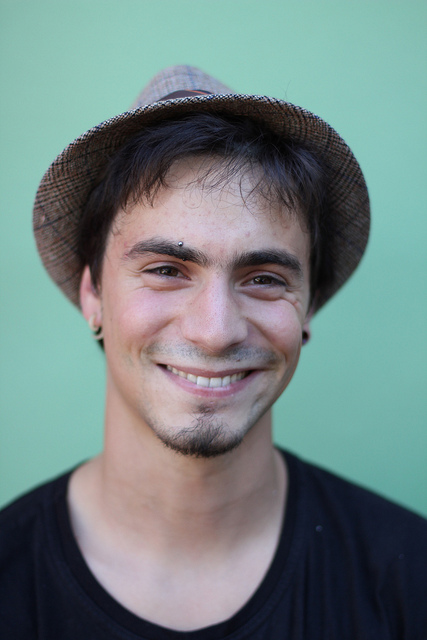

Photos/zaz1.jpg vs Photos/zaz3.jpg , dif =  0.476937366762


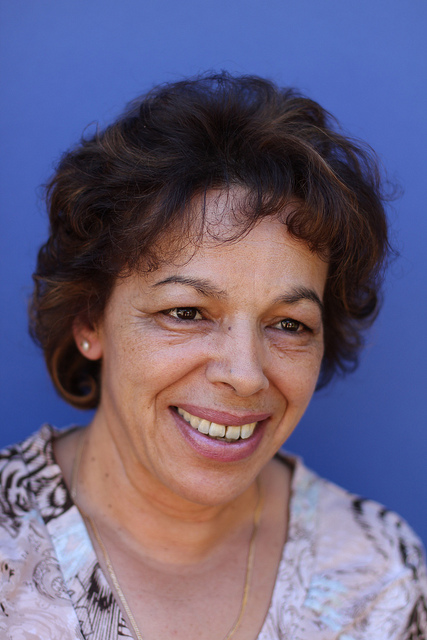

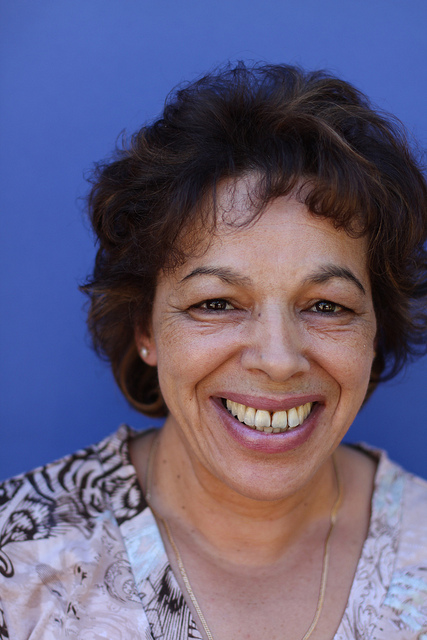

Photos/bill3.jpg vs Photos/bill1.jpg , dif =  0.572347322694


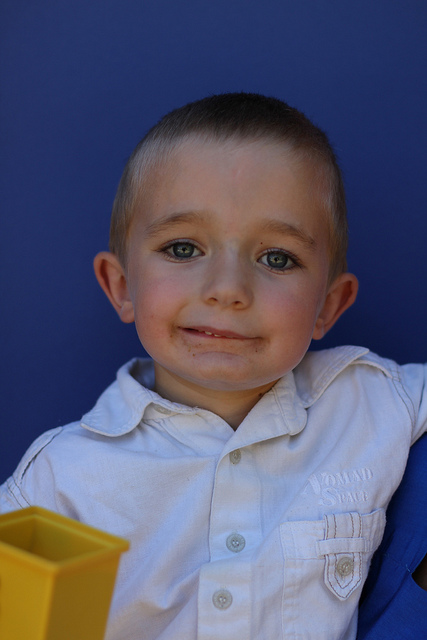

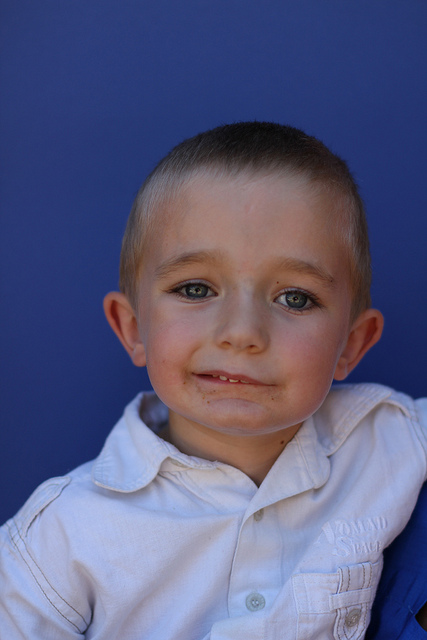

Photos/liz1.jpg vs Photos/liz2.jpg , dif =  0.825115052434


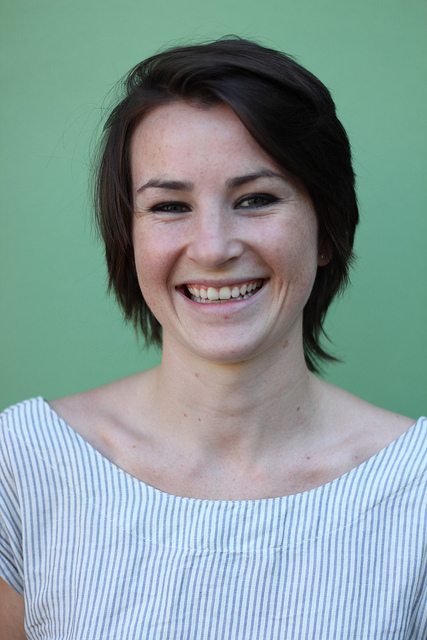

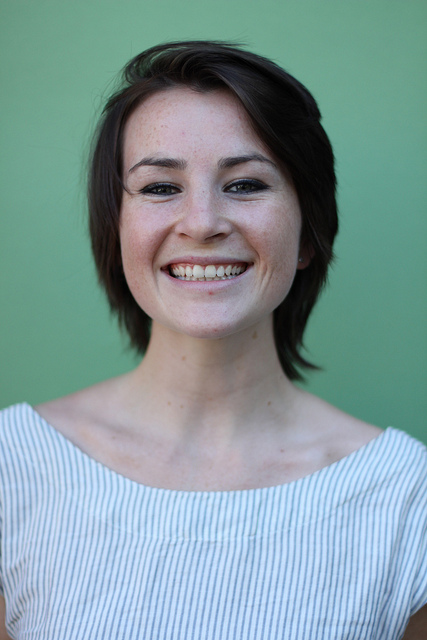

Photos/liz2.jpg vs Photos/liz3.jpg , dif =  0.296768757927


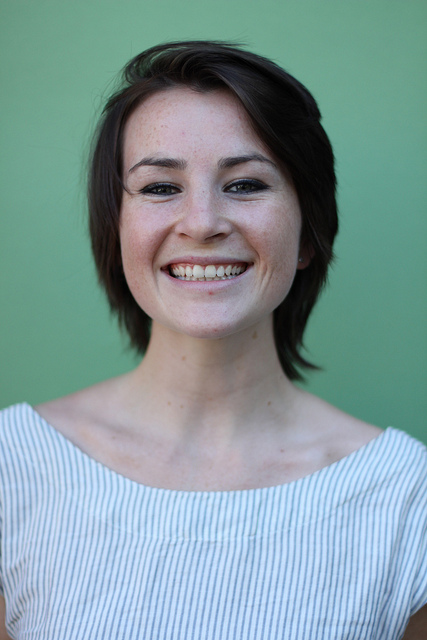

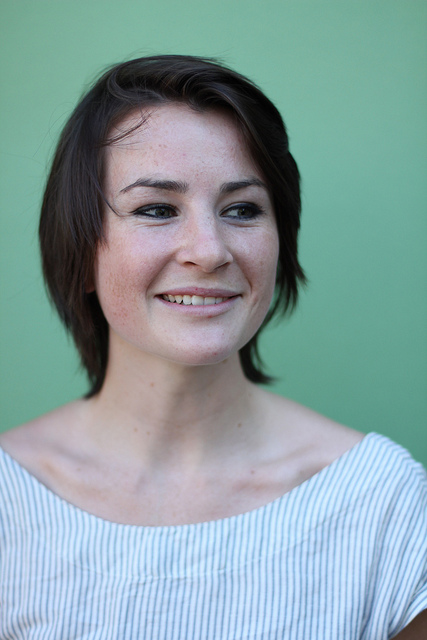

Photos/mum3.jpg vs Photos/mum2.jpg , dif =  0.514980619486


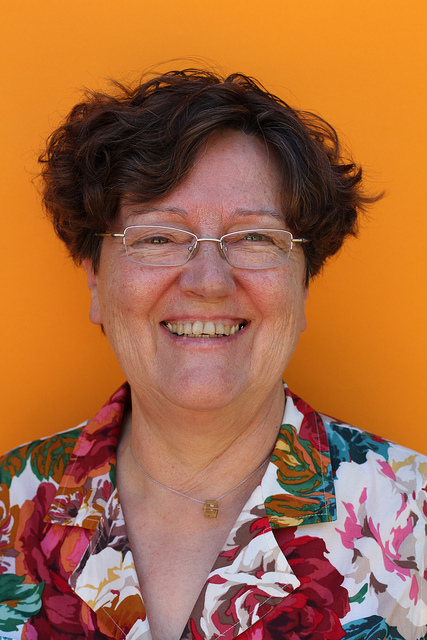

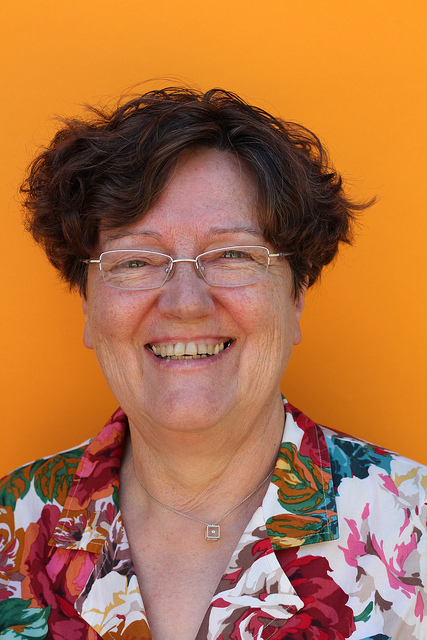

Photos/bet1.jpg vs Photos/zaz1.jpg , dif =  0.8123548


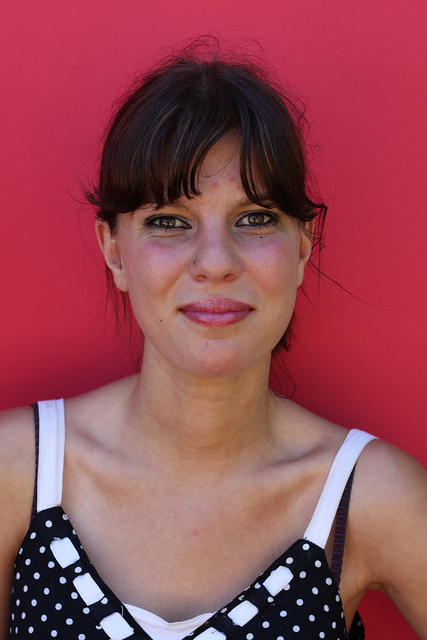

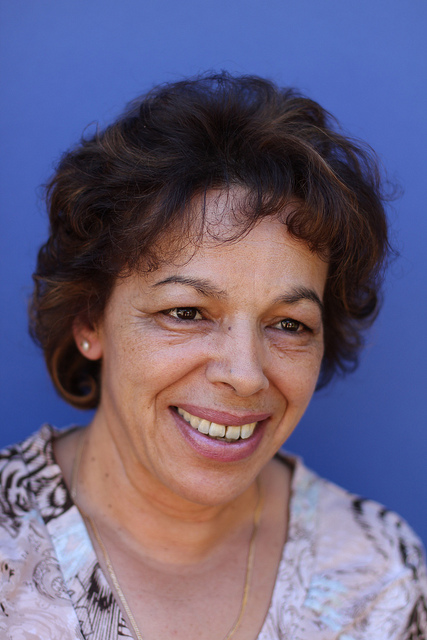

Photos/dad1.jpg vs Photos/dad3.jpg , dif =  0.158636303343


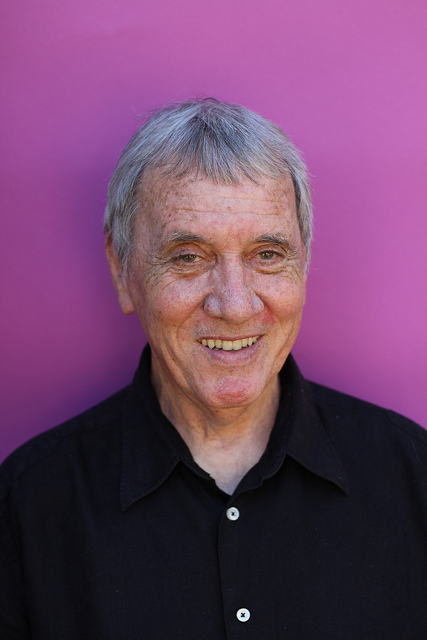

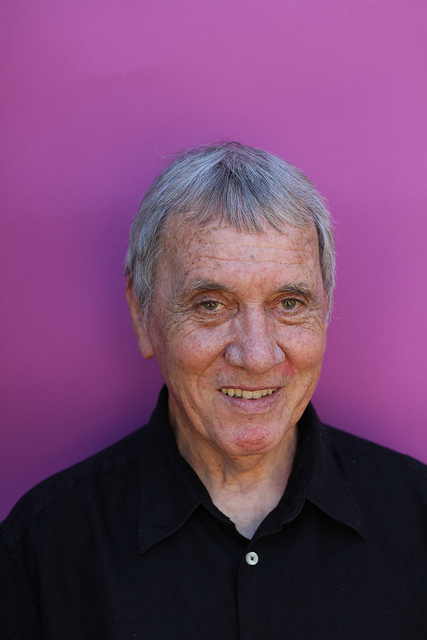

Photos/joe1.jpg vs Photos/joe2.jpg , dif =  0.407439013348


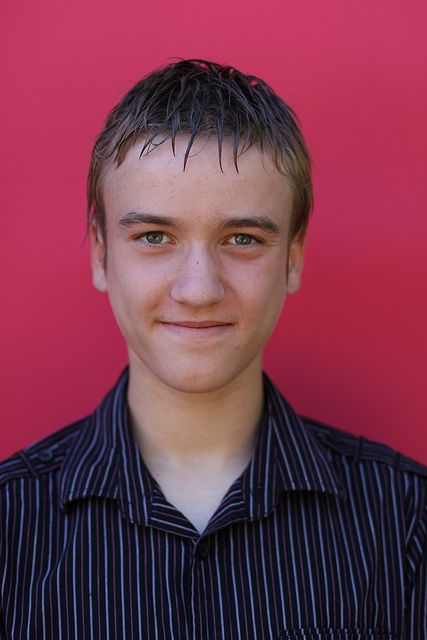

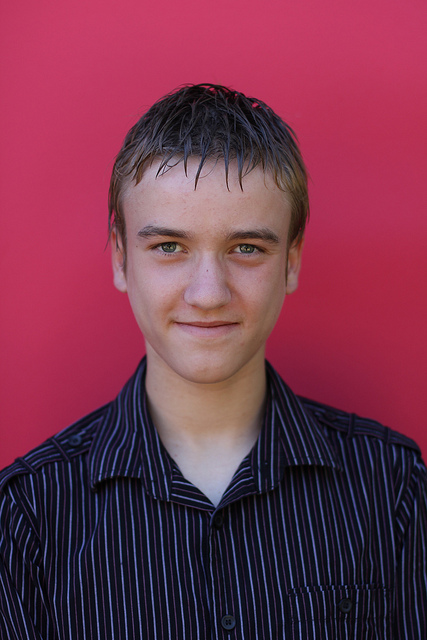

Photos/dad2.jpg vs Photos/dad1.jpg , dif =  0.302987064366


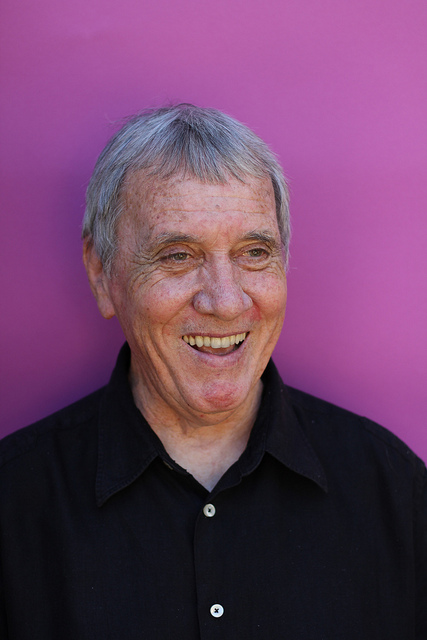

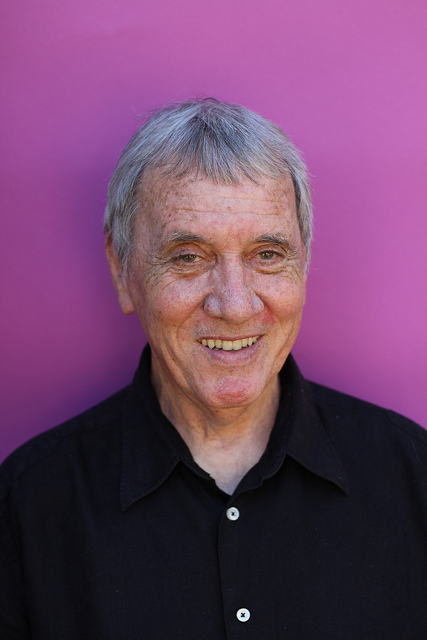

Photos/mum1.jpg vs Photos/mum2.jpg , dif =  0.894012243881


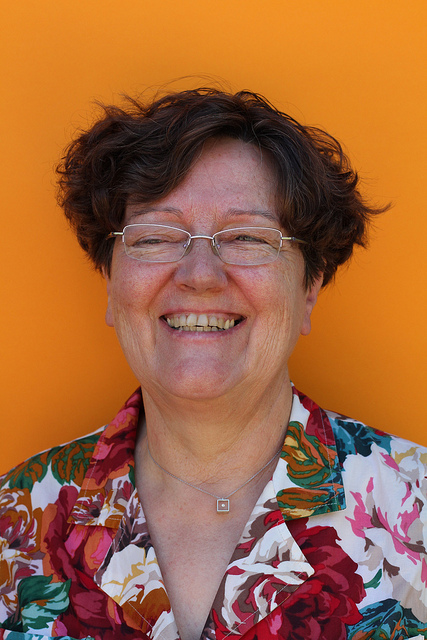

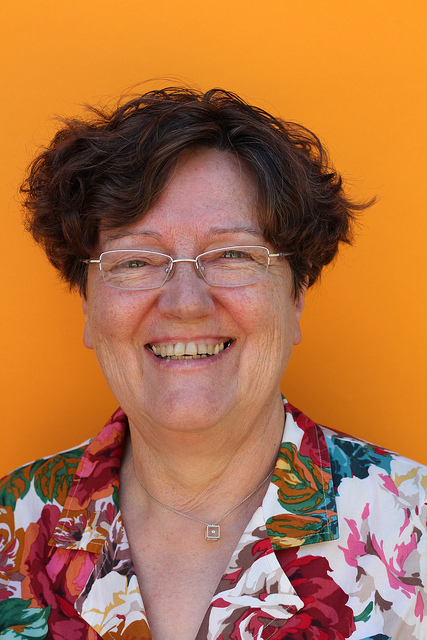

Photos/zaz3.jpg vs Photos/zaz2.jpg , dif =  0.286945188656


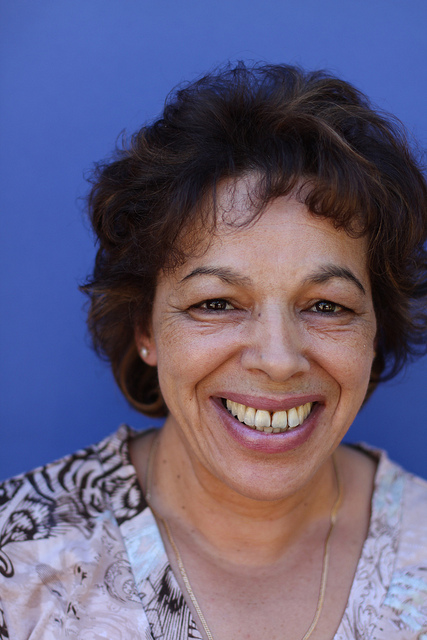

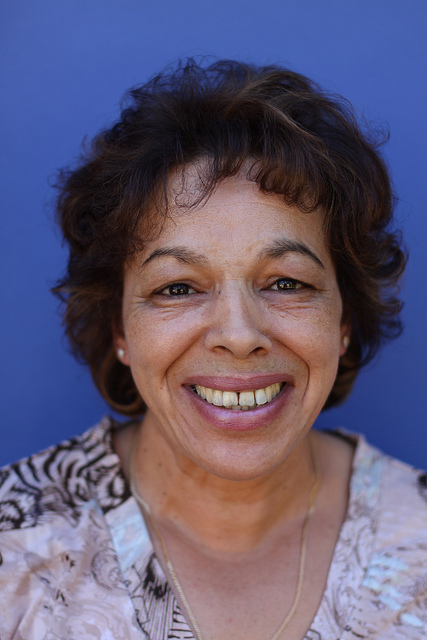

Photos/bet2.jpg vs Photos/joe2.jpg , dif =  1.07542189541


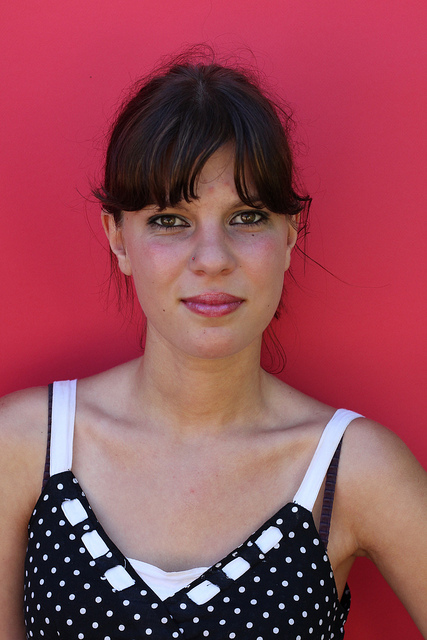

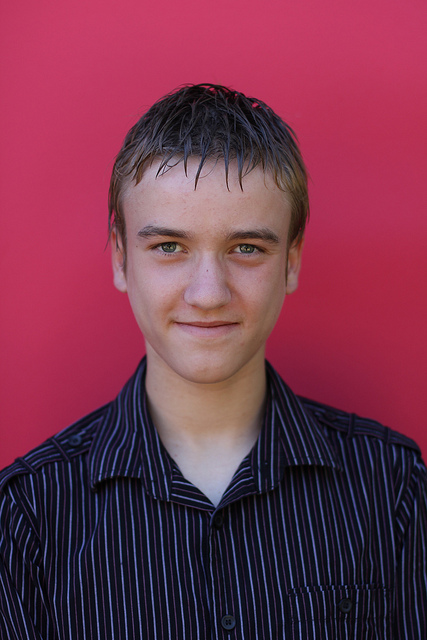

Photos/bill1.jpg vs Photos/bill3.jpg , dif =  0.572347322694


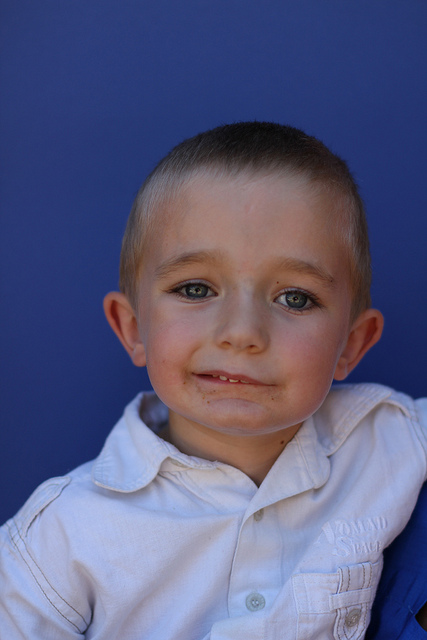

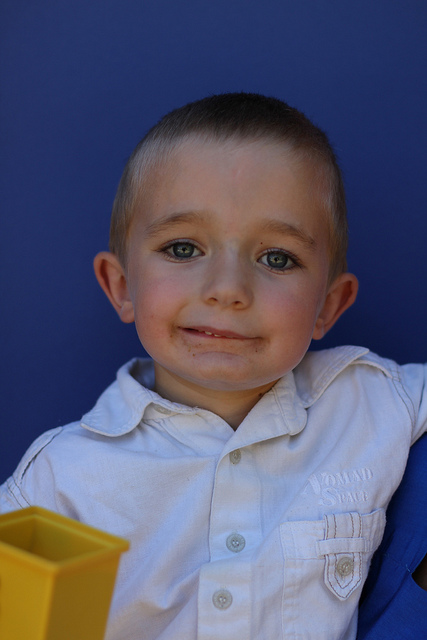

Photos/flo1.jpg vs Photos/flo2.jpg , dif =  0.207888063001


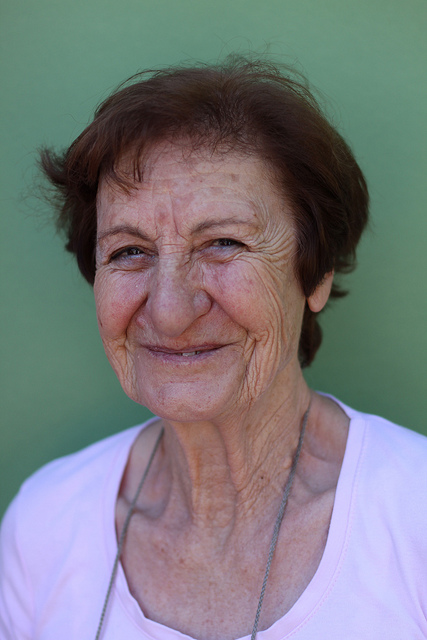

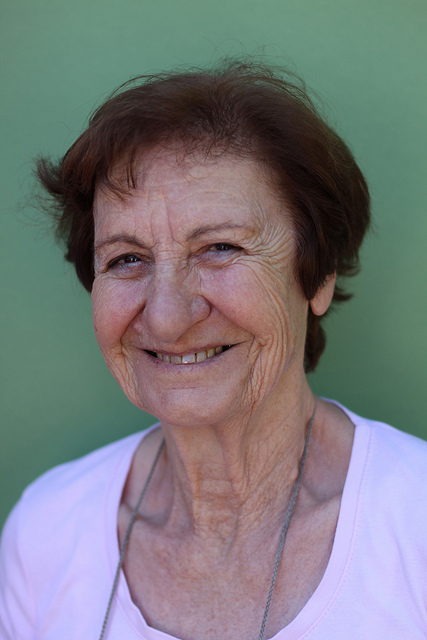

Photos/fred1.jpg vs Photos/fred3.jpg , dif =  0.279752450589


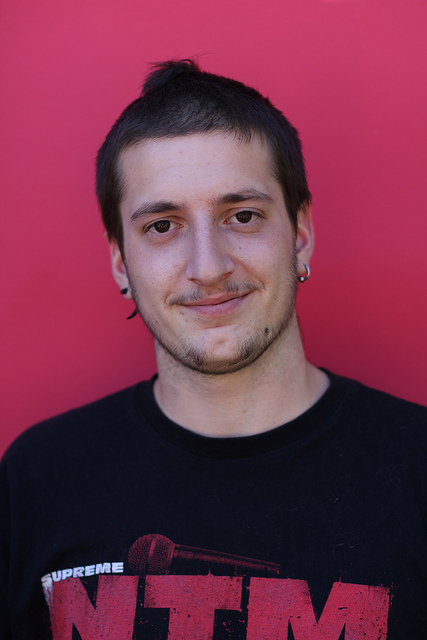

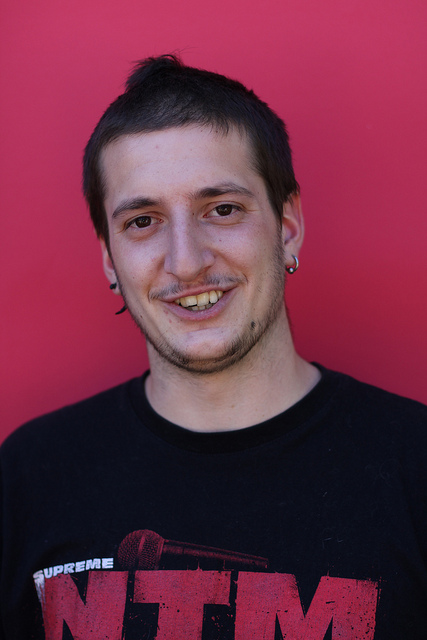

Photos/mum2.jpg vs Photos/mum3.jpg , dif =  0.514980619486


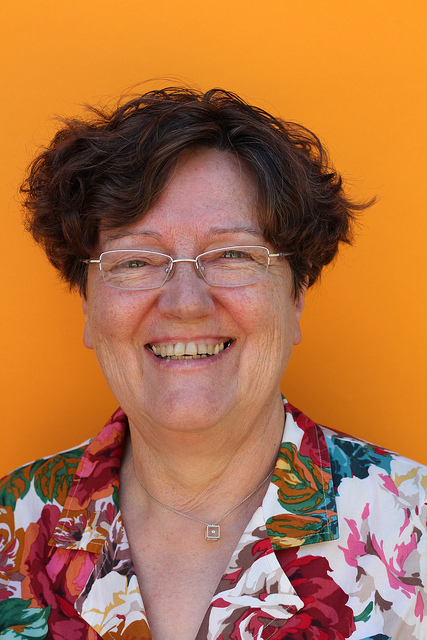

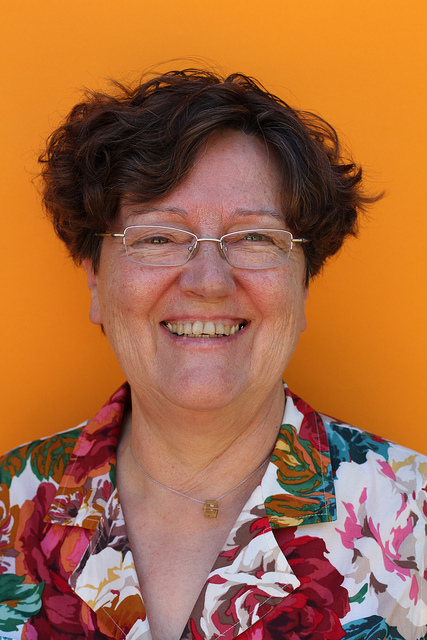

Photos/joe2.jpg vs Photos/joe1.jpg , dif =  0.407439013348


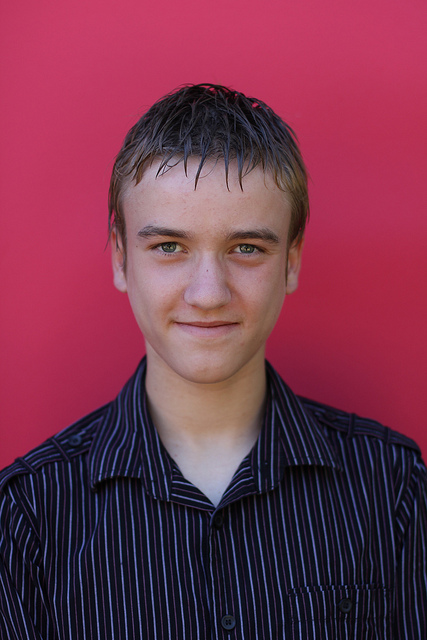

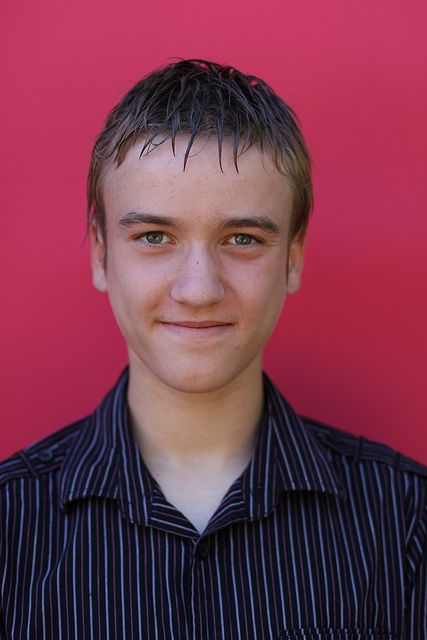

Photos/fly3.jpg vs Photos/fly2.jpg , dif =  0.317693143742


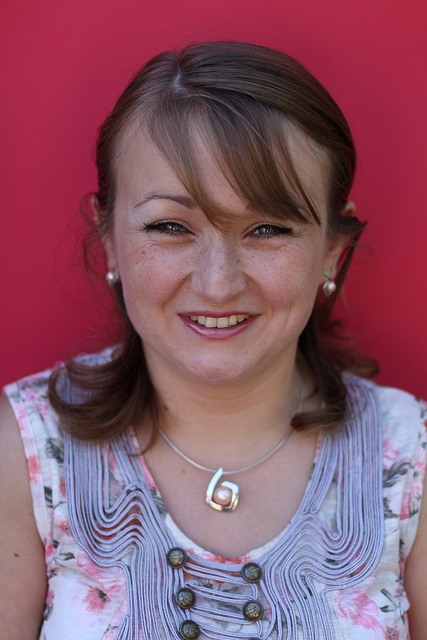

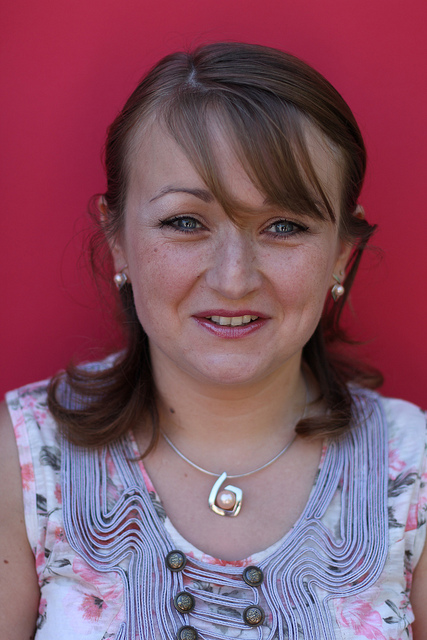

Photos/fred2.jpg vs Photos/fred1.jpg , dif =  0.374300581142


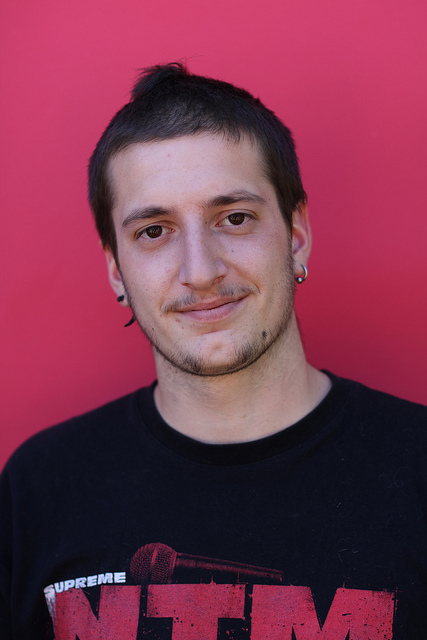

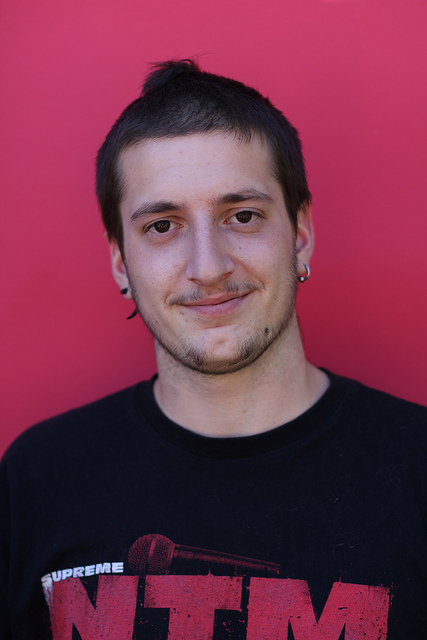

Photos/fly2.jpg vs Photos/fly3.jpg , dif =  0.317693143742


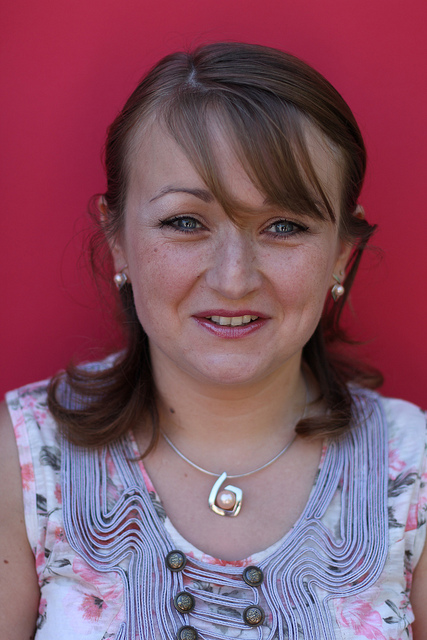

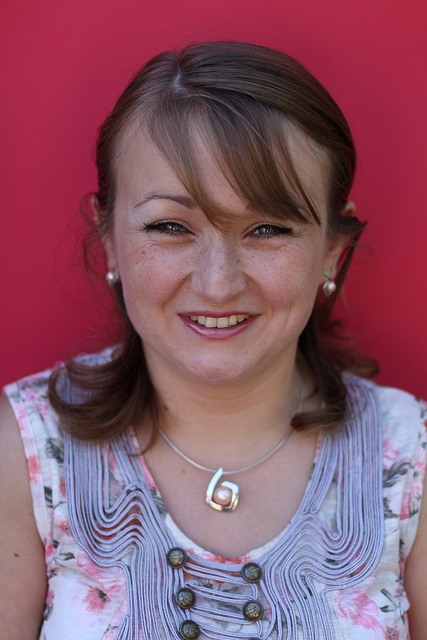

Photos/jack3.jpg vs Photos/jack1.jpg , dif =  0.204358475867


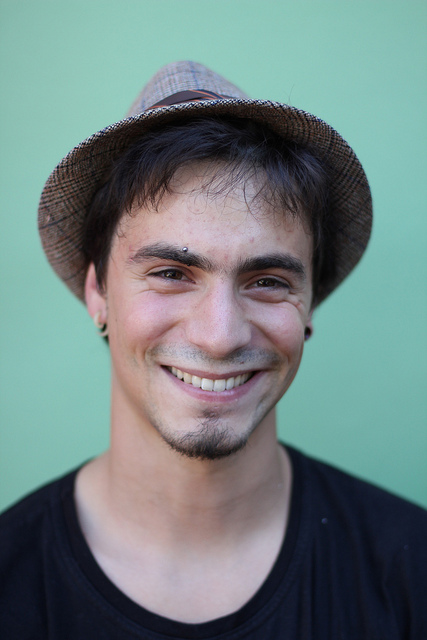

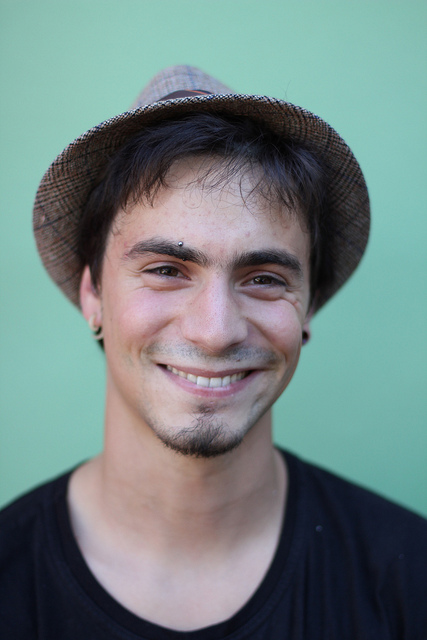

Photos/bill2.jpg vs Photos/zaz1.jpg , dif =  0.55967038931


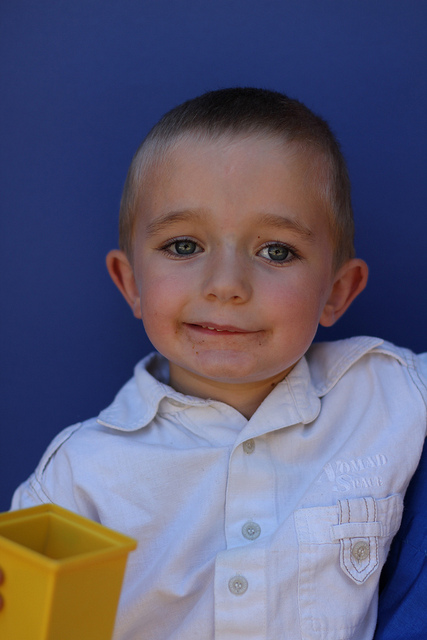

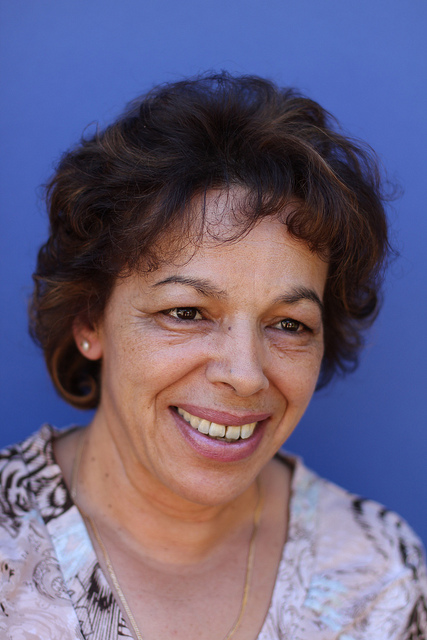

Photos/flo2.jpg vs Photos/flo1.jpg , dif =  0.207888063001


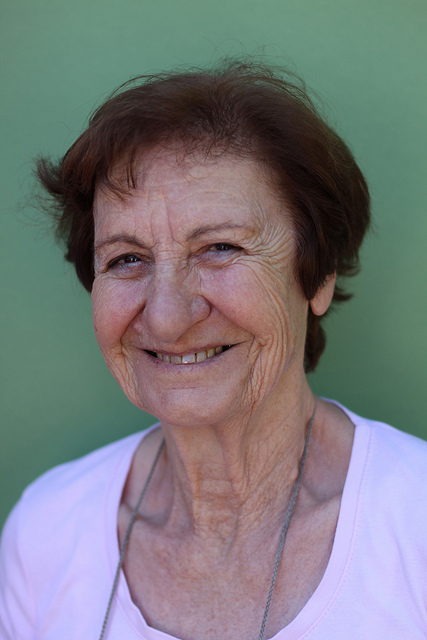

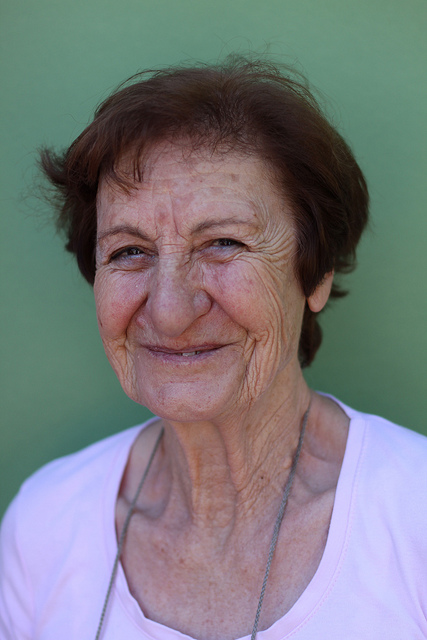

Photos/jack1.jpg vs Photos/jack3.jpg , dif =  0.204358475867


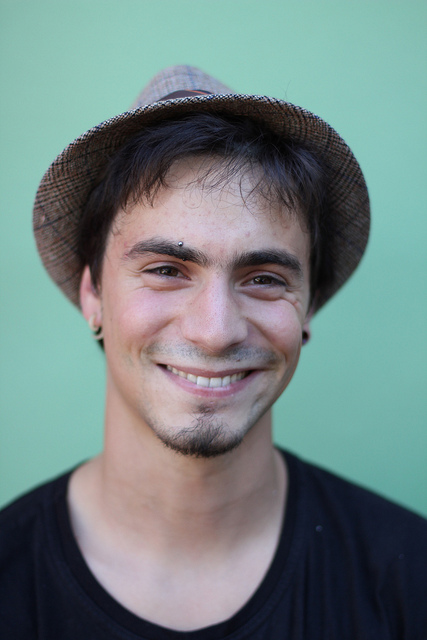

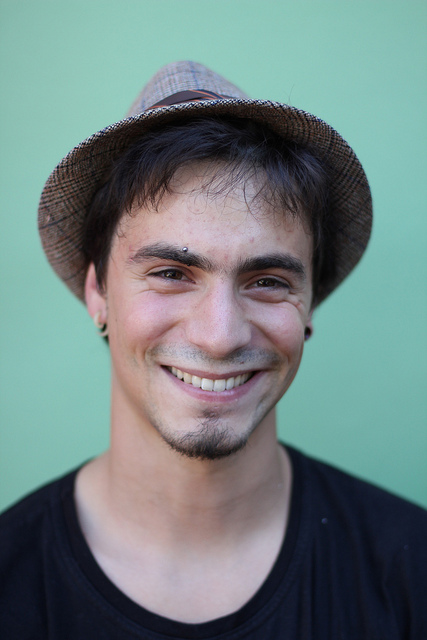

Photos/zaz2.jpg vs Photos/zaz3.jpg , dif =  0.286945188656


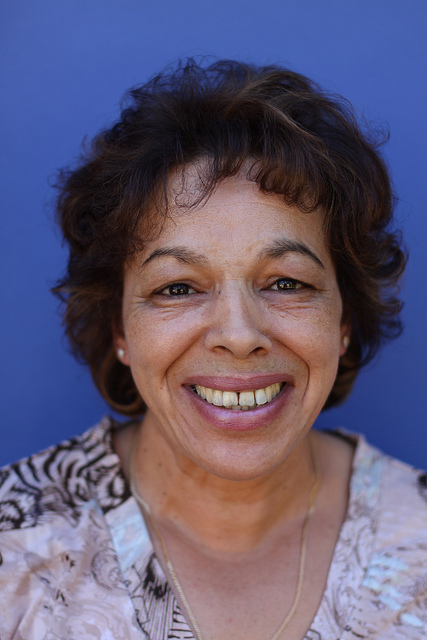

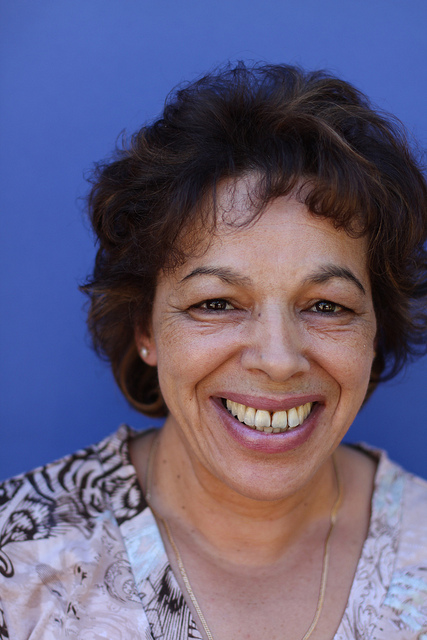

Photos/fred3.jpg vs Photos/fred1.jpg , dif =  0.279752450589


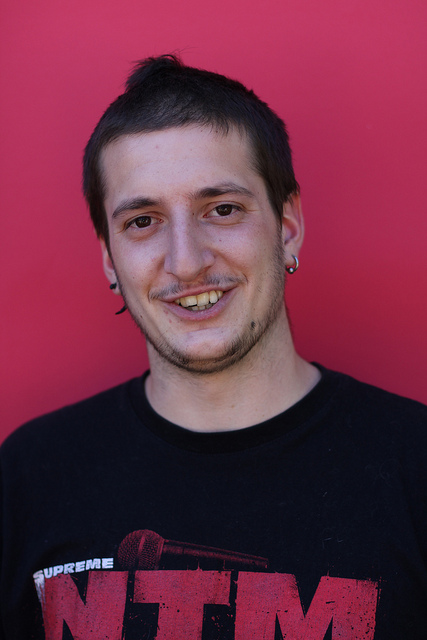

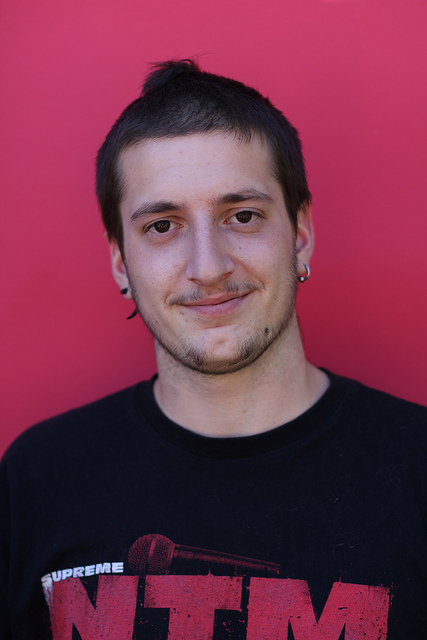

Photos/flo3.jpg vs Photos/flo2.jpg , dif =  0.363008569972


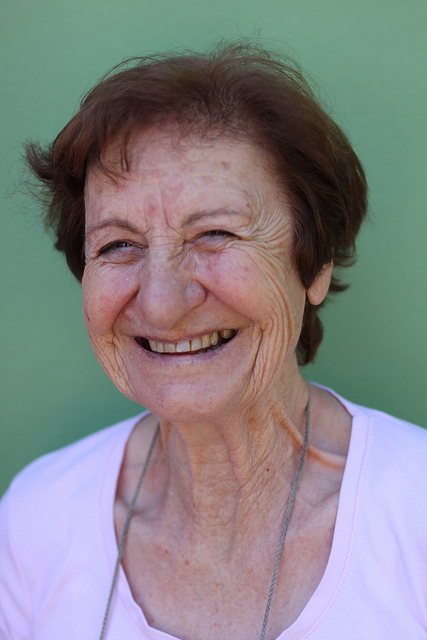

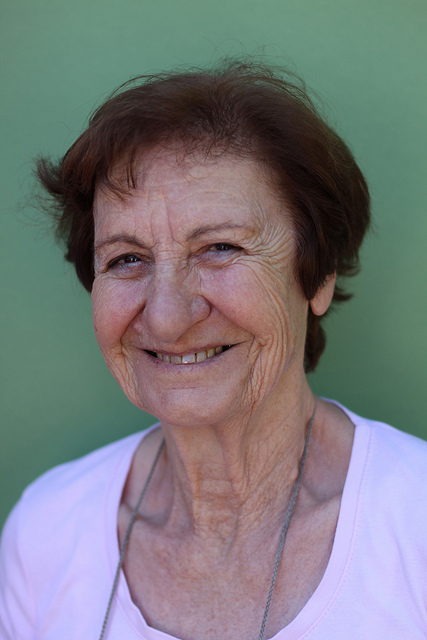

Photos/bet3.jpg vs Photos/joe2.jpg , dif =  1.07542189541


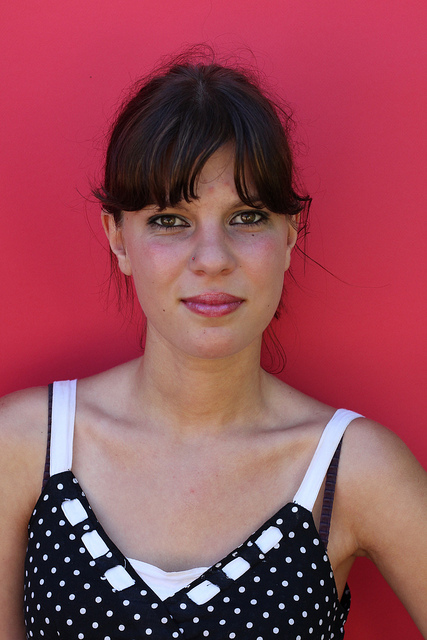

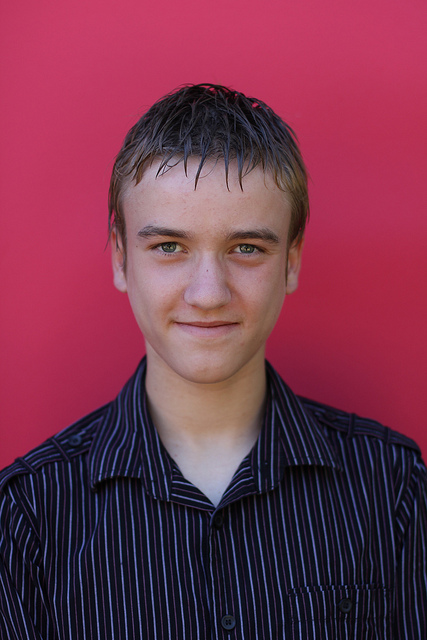

Photos/dad3.jpg vs Photos/dad1.jpg , dif =  0.158636303343


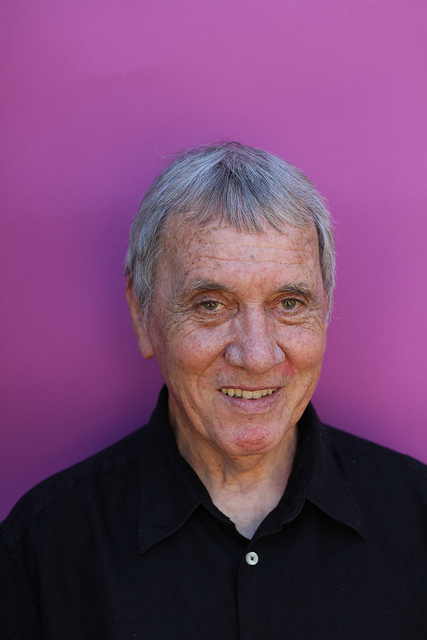

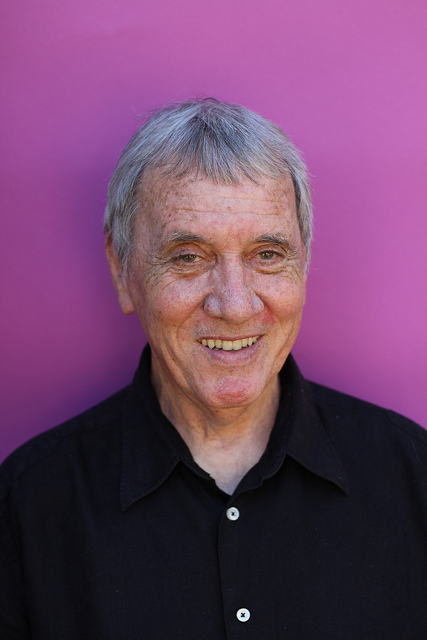

Photos/liz3.jpg vs Photos/liz2.jpg , dif =  0.296768757927


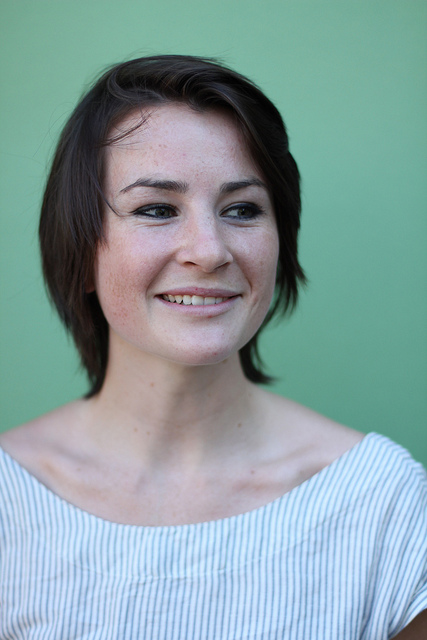

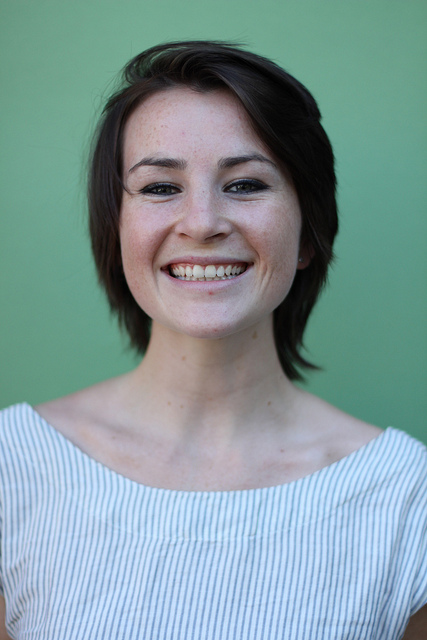

Photos/fly1.jpg vs Photos/fly2.jpg , dif =  0.500134869061


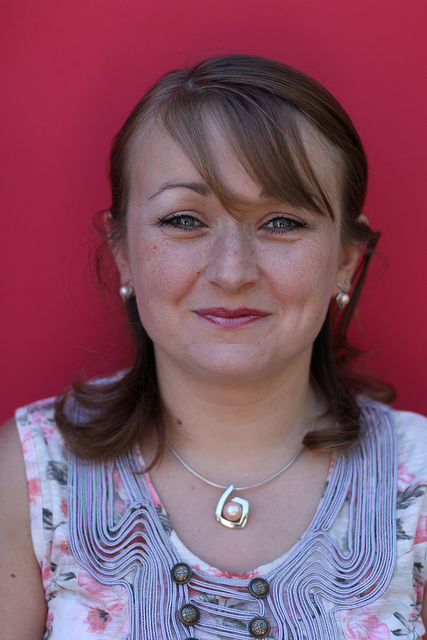

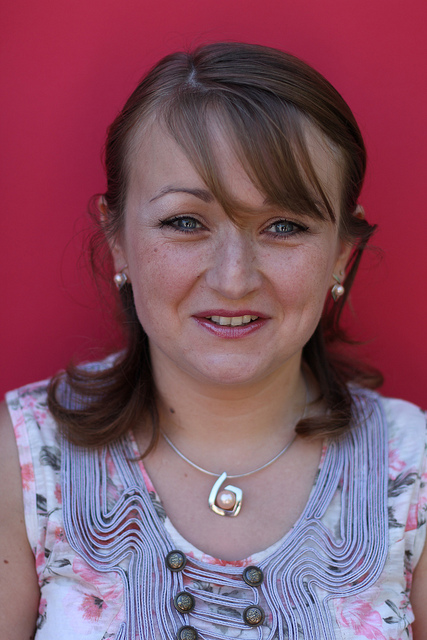

In [17]:
comparePhotos(histo)

Profitons des capacités du notebook pour écrire une classe permettant de visualiser une matrice de ressemblance entre les visages.

In [42]:
class MatriceDeVisages(object):
    def __init__(self, db):
        self.db = db

    def _repr_html_(self):
        body = "<table style=\"font-size: 8px\"><thead><td width=\"21px\"></td>"
        for chemin, histo in sorted(self.db.items()):
            body += "<td><img width=\"21px\" src=\""
            body += chemin
            body += "\" alt=\"?\"></td>"
        body += "</thead><tbody>"
        for chemin1, histo1 in sorted(self.db.items()):
            body += "<tr><td align=\"right\"><img width=\"15px\" src=\""
            body += chemin1
            body += "\" alt=\"?\"></td>"            
            ppdif = 666.0 # valeure arbitrairement grande
            ppchemin = chemin1
            for chemin2, histo2 in sorted(self.db.items()):
                dif = differenceEntreHistogrammes(histo1,histo2)
                body += "<td style=\"background-color: rgb(" + str(int(dif*255/3)) + "," + str(int(dif*255/3)) + "," + str(int(dif*255/3)) + ")\">" + str(round(dif,2)) + "</td>"
                if (dif < ppdif) and (dif > 0.0) :
                    ppdif = dif
                    ppchemin = chemin2
            body += "</tr>"
        body += "</tbody></table>"
        return body

In [43]:
MatriceDeVisages(histo)

,0.0,1.14,1.14,0.85,0.93,0.93,1.28,1.39,1.26,1.55,1.54,1.43,1.48,1.37,1.18,2.03,1.8,2.0,2.99,3.32,2.9,1.23,1.38,3.48,3.82,3.87,1.5,1.25,1.38,0.81,0.89,0.85
,1.14,0.0,0.0,1.22,1.68,1.12,1.45,1.59,1.41,1.62,1.55,1.35,1.47,1.44,1.32,1.7,1.47,1.63,2.26,2.77,2.14,1.11,1.08,2.95,3.37,3.45,1.23,1.59,1.64,1.52,1.13,1.16
,1.14,0.0,0.0,1.22,1.68,1.12,1.45,1.59,1.41,1.62,1.55,1.35,1.47,1.44,1.32,1.7,1.47,1.63,2.26,2.77,2.14,1.11,1.08,2.95,3.37,3.45,1.23,1.59,1.64,1.52,1.13,1.16
,0.85,1.22,1.22,0.0,0.65,0.57,1.02,1.11,0.96,1.32,1.32,1.21,1.25,1.16,1.0,1.95,1.78,1.92,2.57,2.83,2.47,0.93,0.98,3.01,3.28,3.32,1.05,0.96,1.04,0.75,0.76,0.72
,0.93,1.68,1.68,0.65,0.0,0.81,1.13,1.23,1.09,1.35,1.37,1.27,1.36,1.18,1.04,1.99,1.86,1.99,2.96,3.17,2.85,1.05,1.17,3.33,3.62,3.65,1.56,1.09,1.05,0.56,0.77,0.79
,0.93,1.12,1.12,0.57,0.81,0.0,1.37,1.47,1.31,1.63,1.64,1.55,1.62,1.51,1.34,2.29,2.12,2.24,2.46,2.76,2.37,1.23,1.27,2.96,3.22,3.27,1.12,1.05,1.19,0.98,1.09,1.09
,1.28,1.45,1.45,1.02,1.13,1.37,0.0,0.3,0.16,0.66,0.68,0.72,0.92,0.79,0.72,1.24,1.13,1.14,2.55,2.88,2.48,0.64,0.91,3.06,3.39,3.44,1.31,1.19,1.15,0.95,0.78,0.81
,1.39,1.59,1.59,1.11,1.23,1.47,0.3,0.0,0.32,0.67,0.77,0.88,1.07,0.92,0.86,1.39,1.32,1.22,2.63,2.94,2.56,0.81,1.02,3.13,3.44,3.48,1.43,1.3,1.24,1.01,0.9,0.89
,1.26,1.41,1.41,0.96,1.09,1.31,0.16,0.32,0.0,0.69,0.69,0.68,0.89,0.77,0.71,1.24,1.13,1.15,2.49,2.81,2.42,0.61,0.85,2.99,3.33,3.37,1.26,1.14,1.09,0.95,0.77,0.8
,1.55,1.62,1.62,1.32,1.35,1.63,0.66,0.67,0.69,0.0,0.21,0.47,0.74,0.63,0.62,1.06,1.06,0.98,2.38,2.63,2.3,0.87,0.93,2.84,3.17,3.23,1.55,1.48,1.34,1.14,0.98,0.99
,1.54,1.55,1.55,1.32,1.37,1.64,0.68,0.77,0.69,0.21,0.0,0.36,0.67,0.58,0.57,0.95,0.95,0.89,2.28,2.55,2.19,0.83,0.88,2.75,3.11,3.18,1.52,1.48,1.37,1.17,0.96,0.96


Quelques autres histogrammes ( pour aller plus loin )
----------------------------

In [20]:
def histogrammeRGB(image, affiche=False):
    # Retourne un comptage des composantes R,G,B d'une image sans compter le noir
    # sous la forme de 3 histogrammes normalisés
    # si l'option affiche est activée, alors un graphique est présenté
    histoR = np.zeros(256, dtype='double')
    histoG = np.zeros(256, dtype='double')
    histoB = np.zeros(256, dtype='double')
    # comptage des pixels/composante non nuls et création des histogrammes non normalisés
    nbPixelsNonNoirs = 0
    for ligne in image:
        for pixel in ligne:
            if ( np.sum(pixel) != 0 ):
                nbPixelsNonNoirs += 1
                histoR[pixel[0]] += 1
                histoG[pixel[1]] += 1
                histoB[pixel[2]] += 1
    # on normalise les histogrammes
    histoR /= nbPixelsNonNoirs
    histoG /= nbPixelsNonNoirs
    histoB /= nbPixelsNonNoirs
    
    # on affiche les histogrammes par défaut
    if (affiche == True):
        show(Step([histoR, histoG, histoB], title="Histogramme des couleurs RBG", xlabel="valeur de la composante R,G ou B",ylabel='Proportion'))
        
    # on retourne les 3 histogrammes normalisés
    return histoR,histoG,histoB

In [21]:
def histogrammeHLS(image, affiche=False):
    # Retourne un comptage des composantes H,L,S d'une image sans compter le noir
    # sous la forme de 3 histogrammes normalisés
    # si l'option affiche est activée, alors un graphique est présenté
    histoH = np.zeros(256, dtype='double')
    histoL = np.zeros(256, dtype='double')
    histoS = np.zeros(256, dtype='double')
    # comptage des pixels/composante non nuls et création des histogrammes non normalisés
    nbPixelsNonNoirs = 0
    for ligne in image:
        for pixel in ligne:
            if ( np.sum(pixel) != 0 ):
                nbPixelsNonNoirs += 1
                hls = colorsys.rgb_to_hls(pixel[0]/255.0,pixel[1]/255.0,pixel[2]/255.0)
                histoH[int(255*hls[0])] += 1
                histoL[int(255*hls[1])] += 1
                histoS[int(255*hls[2])] += 1
    # on normalise les histogrammes
    histoH /= nbPixelsNonNoirs
    histoL /= nbPixelsNonNoirs
    histoS /= nbPixelsNonNoirs
    
    # on affiche les histogrammes par défaut
    if (affiche == True):
        show(Step([histoH, histoL, histoS], title="Histogramme des couleurs HLS", xlabel="valeur de la composante H,L ou S",ylabel='Proportion'))
        
    # on retourne les 3 histogrammes normalisés
    return histoH,histoL,histoS

In [22]:
import colorsys

def histogrammeHSV(image, affiche=False):
    # Retourne un comptage des composantes H,S,V d'une image sans compter le noir
    # sous la forme de 3 histogrammes normalisés
    # si l'option affiche est activée, alors un graphique est présenté
    histoH = np.zeros(256, dtype='double')
    histoS = np.zeros(256, dtype='double')
    histoV = np.zeros(256, dtype='double')
    # comptage des pixels/composante non nuls et création des histogrammes non normalisés
    nbPixelsNonNoirs = 0
    for ligne in image:
        for pixel in ligne:
            if ( np.sum(pixel) != 0 ):
                nbPixelsNonNoirs += 1
                hsv = colorsys.rgb_to_hsv(pixel[0]/255.0,pixel[1]/255.0,pixel[2]/255.0)
                histoH[int(255*hsv[0])] += 1
                histoS[int(255*hsv[1])] += 1
                histoV[int(255*hsv[2])] += 1
    # on normalise les histogrammes
    histoH /= nbPixelsNonNoirs
    histoS /= nbPixelsNonNoirs
    histoV /= nbPixelsNonNoirs
    
    # on affiche les histogrammes par défaut
    if (affiche == True):
        show(Step([histoH, histoS, histoV], title="Histogramme des couleurs HSV", xlabel="valeur de la composante H,S ou V",ylabel='Proportion'))
        
    # on retourne les 3 histogrammes normalisés
    return histoH,histoS,histoV